# Figures for paper

## Setup

In [2]:
%cd work/notebooks

/home/jovyan/work/notebooks


In [3]:
# Import modules and R
import numpy as np, pandas as pd
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

In [4]:
# Import local code
import sys
sys.path.append('/home/jovyan/work/code')
from gradientVersion import *
from processing_helpers import *
from analysis_helpers import *
from triplets import *
from enrichments_data import *
from enrichments import *
from single_cell import *
from brainspan import *
from maps_data import *
from maps_analysis import *
from maps_null_test import *
from disorders import *
%R source("../code/Rplots.R");
%R source("../code/brainPlots.R");
%R source("../code/enrichmentsPlots.R");
%R source("../code/plot_maps.R");
%R source("../code/brainspanPlots.R");



https://community.rstudio.com/c/tidyverse

Attaching package: ‘ggpp’



    annotate


System has not been booted with systemd as init system (PID 1). Can't operate.
Failed to connect to bus: Host is down
Attaching package: ‘ggh4x’



    stat_centroid



    geom_pointpath, GeomPointPath




### Compute versions

In [7]:
pca_base = gradientVersion(approach='pca', kernel=None).fit('hcp_base')
dme_3d_ds5 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_3d_ds5')

New gradients version: method=pca, kernel=None, sparsity=0, data=hcp_base
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=hcp_3d_ds5


In [8]:
weights = dme_3d_ds5.weights.iloc[:,:3]
null_weights = shuffle_gene_weights(weights, n=5000, rank=False)

Output scores and weights

In [469]:
# dme_3d_ds5.clean_scores().to_csv('../outputs/ahba_dme_hcp_top8kgenes_scores.csv')
# dme_3d_ds5.weights.iloc[:,:3].to_csv('../outputs/ahba_dme_hcp_top8kgenes_weights.csv')

---

# Fig 1

### Axes & simple triplets

In [435]:
versions_scores = pd.concat({
   'PCA, all genes\nall regions': pca_base.clean_scores(),
   'DME, top 50% genes\nonly 3+ donor regions': dme_3d_ds5.clean_scores(),
}).reset_index(level=0).rename({'level_0': 'version'}, axis=1)

In [437]:
# triplets_base = load_pickle('triplets')
# triplets_3d = load_pickle('triplets_3donors')

# triplets_dict = {
#     'PCA, all regions': make_triplet_ds_plot(get_triplets_stability_levels(triplets_base)),
#     'DME, only 3+ donor regions': make_triplet_ds_plot(get_triplets_stability_levels(triplets_3d))
# }
# save_pickle(triplets_dict, 'triplets_dict')

triplets_dict = load_pickle('triplets_dict')

In [438]:
triplets_df = pd.concat({
    "PCA, all genes\nall regions": triplets_dict['PCA, all regions'].loc[lambda x: x['version']==0],
    "DME, top 50% genes\nonly 3+ donor regions": triplets_dict['DME, only 3+ donor regions'].loc[lambda x: x['version']==0.5]
}).drop('version', axis=1).reset_index(0).rename({'level_0':'version'}, axis=1)
# triplets_df

In [439]:
triplets_df.groupby(['version','how','component']).median()

corr  \
version                                   how           component             
DME, top 50% genes\nonly 3+ donor regions Region scores 1          0.956908   
                                                        2          0.666887   
                                                        3          0.643539   
                                                        4         -0.140626   
                                                        5         -0.010216   
PCA, all genes\nall regions               Region scores 1         -0.191852   
                                                        2          0.068152   
                                                        3          0.032535   
                                                        4         -0.112639   
                                                        5          0.033329   

                                                                   corr_abs  
version                                   how           component            
DME, top 50% genes\nonly 3+ donor regions Region scores 1          0.956908  
                                                        2          0.723390  
                                                        3          0.643539  
                                                        4          0.279726  
                                                        5          0.330640  
PCA, all genes\nall regions               Region scores 1          0.721299  
                                                        2          0.118019  
                                                        3          0.112725  
                                                        4          0.145198  
                                                        5          0.298827

/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: UserWarning: DataFrame contains duplicated elements in the index, which will lead to loss of the row names in the resulting data.frame
  warnings.warn('DataFrame contains duplicated elements in the index, '



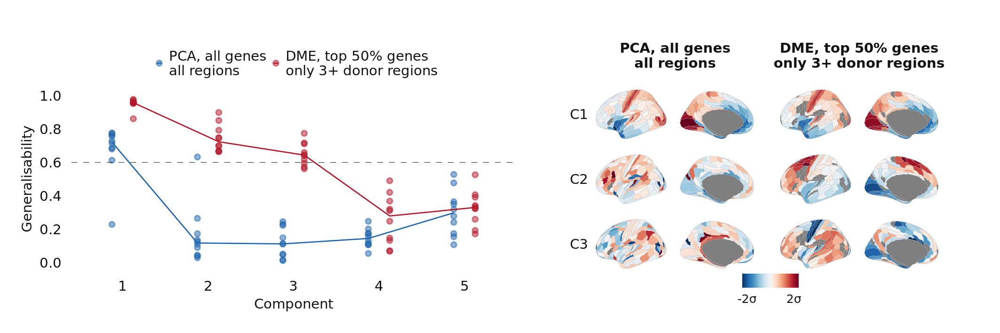

In [440]:
%%R -i triplets_df -i versions_scores -w 180 -h 60 --units mm -r 300
source("../code/fig1_plots.R")

c1 <- plot_generalisability(triplets_df)
c2 <- plot_brain_maps(versions_scores)

c1 + c2

### GO enrichments

In [441]:
go_enrichments.loc[lambda x: x['G']=='G3'].loc[lambda x: x['direction']=='top'].sort_values(['direction', 'FDR'])
# pd.options.display.max_rows=100

NameError: name 'go_enrichments' is not defined

In [442]:
go_enrichments = combine_go_enrichments('dm_hcp_3d_ds5', 'Process', include_c1=True, top_n=1000, FDR_filter=0.05)

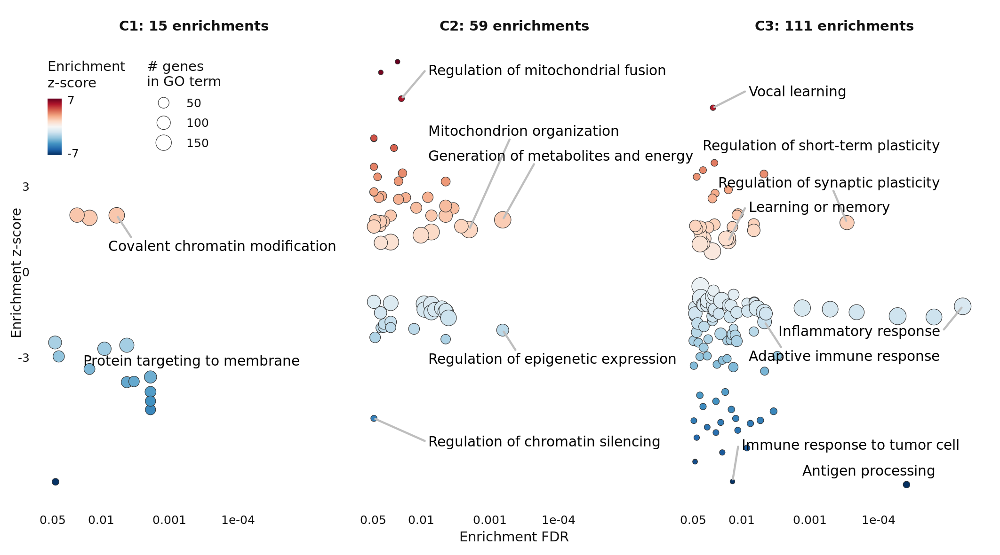

In [443]:
%%R -i go_enrichments -w 180 -h 100 -u mm -r 300
source("../code/fig1_plots.R")
plot_go_enrichments(go_enrichments)

### Layer enrichments

In [444]:
layer_genes = get_layer_genes(which='maynard', add_hse_genes=True)
layer_stats = compute_null_p(*compute_enrichments(weights, null_weights, layer_genes))

### Cell enrichments

In [445]:
cell_genes = get_cell_genes(which='jakob', add_synapses=True)
order = ['Synapses', 'Neuro-Ex', 'Neuro-In', 'Astro', 'Micro', 'Endo', 'Oligo', 'OPC']
true_scores, null_scores, counts = compute_enrichments(weights, null_weights, cell_genes, how='mean')
cell_stats = compute_null_p(true_scores, null_scores, adjust='fdr_bh', order=order)

In [446]:
cell_rename = {
    'Synapses':'Syn',
    'Neuro-Ex':'N-Ex',
    'Neuro-In':'N-In',
    'Astro':'Astro',
    'Micro':'Micro',
    'Endo':'Endo',
    'Oligo':'Oligo',
    'OPC':'OPC'
}
# cell_rename = {v:k for k,v in cell_rename.items()}
    
cell_stats = cell_stats.replace({'label':cell_rename}).sort_values(['label','C'])


### GWAS enrichments

In [447]:
gwas_thickness = (pd.read_csv("../data/gwas/warrier2022_tableS23.csv", index_col=0, header=1).reset_index()
             .rename({'Phenotype':'label', 'Gene Symbol':'gene'}, axis=1)
             .loc[lambda x: x['label']=='Cortical thickness', ['label','gene']]
             )

gwas_wm = (pd.read_csv("../data/gwas/sha2023_tableS18.csv", header=1)
 .dropna()['Gene name'].rename('gene').to_frame()
 .assign(label='WM connectivity')
)

gwas_structure = pd.concat([gwas_thickness, gwas_wm])
gwas_structure_stats = compute_null_p(*compute_enrichments(weights, null_weights, gwas_structure))

In [448]:
gwas_intelligence = (pd.read_csv("../data/gwas/intelligence.csv", header=0)
 .drop('sniekers2017', axis=1)
 .melt(var_name='label',value_name='gene').dropna()
)
gwas_intelligence_stats = compute_null_p(*compute_enrichments(weights, null_weights, gwas_intelligence))

In [449]:
gwas_rename = {
    'hill2019':'Hill 2019',
    'davies2018':'Davies 2018',
    'savage2018':'Savage 2018',
    'hatoum2022':'Hatoum 2022',
}
gwas_intelligence_stats = gwas_intelligence_stats.replace({'label':gwas_rename}).sort_values(['label','C'])

### Enrichments subpanel

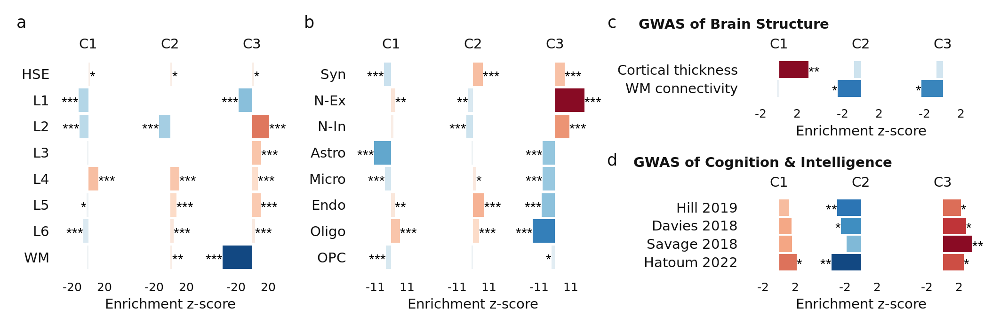

In [450]:
%%R -i cell_stats -i layer_stats -i gwas_structure_stats -i gwas_intelligence_stats -w 180 -h 60 --units mm -r 300
source("../code/fig1_plots.R")

# g_enrichments <- plot_go_enrichments(go_enrichments, size=6.5, name='Biological Process Enrichment FDR') + 
#         theme(axis.text.y = element_text(size=20, color='grey7', family='Calibri')) +
#         theme(plot.tag.position=c(0,.95), plot.margin=margin(b=50))

g_layers <- plot_enrichment_bars_z(layer_stats) + 
        theme(
                plot.tag.position = c(0,1),
                axis.text.y = element_text(margin=margin(r=-1, 'mm'))
        )

g_cells <- plot_enrichment_bars_z(cell_stats) + theme(plot.tag.position = c(0,1))

g_gwas_structure <- plot_enrichment_bars_z(gwas_structure_stats) +
        ggtitle('GWAS of Brain Structure') +
        theme(
                axis.text.y = element_text(margin=margin(t=0,r=0,b=0,l=1,'mm')),
                plot.title = element_text(hjust=0.15, vjust=0, margin = margin(t=-1,r=0,b=0,l=0,'mm')),
                plot.title.position = "plot",
                plot.tag.position = c(0,1)
        )

g_gwas_intelligence <- plot_enrichment_bars_z(gwas_intelligence_stats) +
        ggtitle('GWAS of Cognition & Intelligence') +
        theme(
                axis.text.y = element_text(margin=margin(t=0,r=0,b=0,l=1,'mm')),
                plot.title = element_text(hjust=0.2, vjust=0, margin = margin(t=-1,r=0,b=0,l=0,'mm')),
                plot.title.position = "plot",
                plot.tag.position = c(0,1)
        )

design = c(
    area(t=1, b=20, l=1, r=16),
    area(t=1, b=20, l=17, r=32),
    area(t=1.5, b=7, l=33, r=48),
    area(t=8, b=20, l=33, r=48)
)

enrichments_panels <- (g_layers + g_cells + g_gwas_structure + g_gwas_intelligence) + 
                        plot_layout(design=design) + plot_annotation(tag_level='a')
enrichments_panels

## Combined figure 1

/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: UserWarning: DataFrame contains duplicated elements in the index, which will lead to loss of the row names in the resulting data.frame
  warnings.warn('DataFrame contains duplicated elements in the index, '



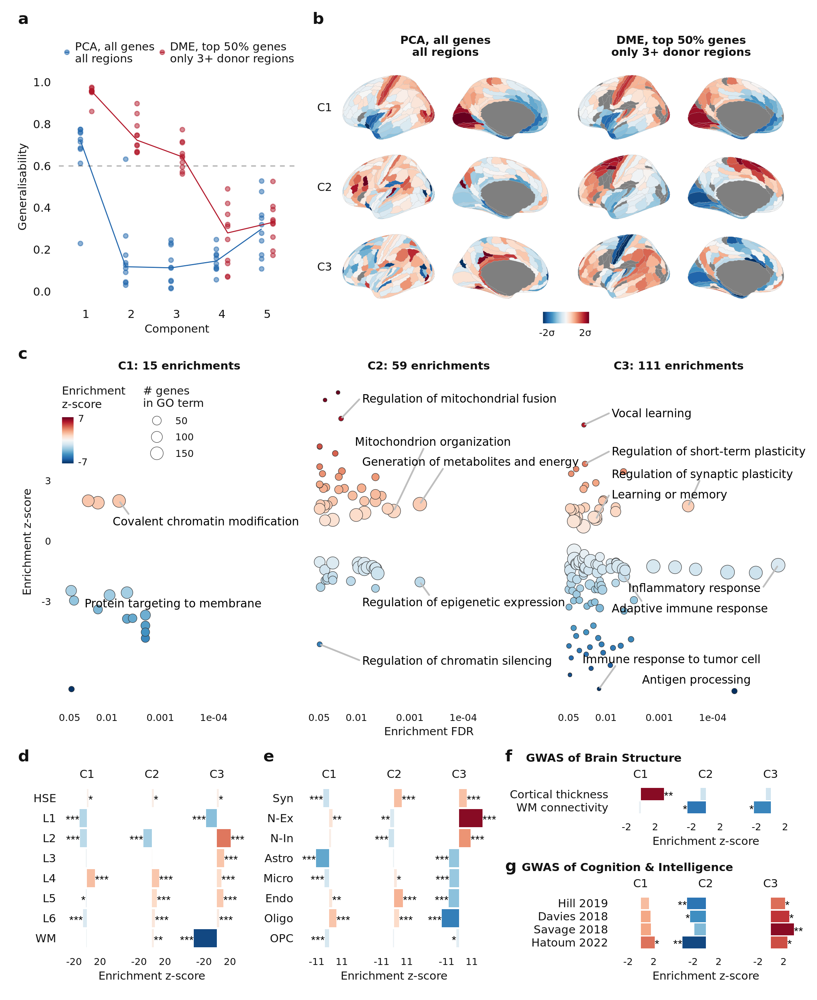

In [451]:
%%R -i triplets_df -i versions_scores -i go_enrichments -w 180 -h 220 --units mm -r 300
source("../code/fig1_plots.R")

p1 <- plot_generalisability(triplets_df) & theme(plot.tag.position = c(0,1))
p2 <- plot_brain_maps(versions_scores) & theme(plot.tag.position = c(0,1))
p3 <- plot_go_enrichments(go_enrichments) & theme(plot.tag.position = c(0,1))

layout <- c(
  area(t = 1, b = 70, l = 1, r = 60),
  area(t = 1, b = 70, l = 61, r = 180),
  area(t = 71, b = 170, l = 1, r = 180),
  area(t = 171, b = 220, l = 1, r = 180)
)

plot <- p1 + p2 + p3 + enrichments_panels + plot_layout(design=layout)

themed <- plot & theme(
  plot.tag = element_text(size=10, face='bold', family='Calibri', hjust=0),
  plot.margin = margin(t=2, b=2, l=2, r=2, unit='mm')
)


annotated <- themed + plot_annotation(tag_level='a',)
annotated

### Cross-correlation

In [162]:
# Scores
dme_3d_ds5.clean_scores().corr()

,C1,C2,C3
C1,1.000000e+00,2.687598e-08,5.443088e-08
C2,2.687598e-08,1.000000e+00,6.623748e-08
C3,5.443088e-08,6.623748e-08,1.000000e+00


In [164]:
# Weights
dme_3d_ds5.weights.corr()

,C1,C2,C3
C1,1.000000,-0.040324,-0.018672
C2,-0.040324,1.000000,-0.106929
C3,-0.018672,-0.106929,1.000000


### Smoothness (Moran's I)

In [165]:
versions_scores.iloc[:,:4].groupby('version', sort=False).agg(get_moran_I).T

version,"PCA, all genes\nall regions","DME, top 50% genes\nonly 3+ donor regions"
C1,0.485524,0.484978
C2,0.090060,0.584921
C3,0.067315,0.205841


### Variance explained

PCA var explained

In [ ]:
pca_3d_ds5 = gradientVersion(approach='pca').fit('hcp_3d_ds5')
pca_3d_ds5.eigenvalues / pca_3d_ds5.expression.var().sum()

New gradients version: method=pca, kernel=None, sparsity=0, data=hcp_3d_ds5


array([0.38643026, 0.10670729, 0.07439592, 0.05532164, 0.03492906])

In [ ]:
pca_3d_ds5.corr_scores(dme_3d_ds5)

,0,1,2,3,4
0,0.995509,-0.011730,-0.006939,-0.031818,0.015161
1,0.011079,0.972851,-0.186220,-0.037015,-0.002587
2,0.000546,0.136586,0.878568,-0.196669,0.314602
3,0.015845,0.082648,0.151314,0.907017,0.234310
4,0.016884,-0.011665,0.166425,0.196055,-0.742322


Var explained from regressing out axes

In [ ]:
PC1_regressed_data = regress_out_axes(pca_3d_ds5, 1)
PC1_regressed_PCs = gradientVersion(approach='pca').fit(PC1_regressed_data)
# PC1_regressed_PCs.corr_scores(pca_3d_ds5).round(4)
PC1_regressed_PCs.eigenvalues / PC1_regressed_data.var().sum()

New gradients version: method=pca, kernel=None, sparsity=0, data=(data given)


array([0.17391224, 0.12125097, 0.09016357, 0.05692762, 0.04942915])

In [ ]:
all_data_var = pca_3d_ds5.expression.var().sum() 
PC1_regressed_data_var = PC1_regressed_data.var().sum()
(all_data_var - PC1_regressed_data_var)/all_data_var

0.3864302580304073

In [ ]:
C1_regressed_data = regress_out_axes(dme_3d_ds5, 1)
C1_regressed_Cs = gradientVersion().fit(C1_regressed_data)
C1_regressed_Cs.corr_scores(dme_3d_ds5).round(4)

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=(data given)


,0,1,2,3,4
0,-0.0062,0.9423,-0.2358,-0.1235,0.0600
1,-0.0210,0.1709,0.8657,-0.1040,0.3541
2,0.0276,0.1623,0.0599,0.9282,0.0631
3,-0.0065,0.0805,0.1320,-0.0386,-0.7332
4,0.0111,-0.0634,0.0720,0.1838,-0.1669


In [ ]:
C1_regressed_PCs = gradientVersion(approach='pca').fit(C1_regressed_data)
C1_regressed_PCs.eigenvalues / C1_regressed_PCs.expression.var().sum()

New gradients version: method=pca, kernel=None, sparsity=0, data=(data given)


array([0.1730151 , 0.12058547, 0.08981319, 0.05679938, 0.04929978])

In [ ]:
all_data_var = dme_3d_ds5.expression.var().sum() 
C1_regressed_data_var = C1_regressed_data.var().sum()
(all_data_var - C1_regressed_data_var)/all_data_var

0.3830432265301258

In [ ]:
C12_regressed_data = regress_out_axes(dme_3d_ds5, 2)
C12_regressed_Cs = gradientVersion().fit(C12_regressed_data)
C12_regressed_Cs.corr_scores(dme_3d_ds5).round(4)

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=(data given)


,0,1,2,3,4
0,-0.0386,-0.0339,0.9103,-0.1115,0.3059
1,0.0066,0.0001,0.1071,0.9215,0.0244
2,-0.0207,-0.0464,0.1573,-0.0416,-0.7683
3,0.0092,0.0007,0.0065,0.2582,0.0453
4,-0.0033,-0.0049,0.0836,0.0282,-0.2512


In [ ]:
all_data_var = dme_3d_ds5.expression.var().sum() 
C12_regressed_data_var = C12_regressed_data.var().sum()
(C1_regressed_data_var - C12_regressed_data_var)/all_data_var

0.10311212003174351

In [ ]:
C123_regressed_data = regress_out_axes(dme_3d_ds5, 3)
C123_regressed_Cs = gradientVersion().fit(C123_regressed_data)
C123_regressed_Cs.corr_scores(dme_3d_ds5).round(4)

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=(data given)


,0,1,2,3,4
0,-0.0010,0.0049,0.0142,0.9316,-0.0847
1,0.0017,0.0184,-0.0031,0.0890,0.8453
2,-0.0202,0.0037,-0.0037,0.1422,-0.3116
3,-0.0169,-0.0089,0.0430,-0.2100,-0.2864
4,-0.0069,-0.0227,-0.0108,0.0217,0.1188


In [ ]:
all_data_var = dme_3d_ds5.expression.var().sum() 
C123_regressed_data_var = C123_regressed_data.var().sum()
(C12_regressed_data_var - C123_regressed_data_var)/all_data_var

0.06535017547283913

### How many correlated genes

In [166]:
top100 = dme_3d_ds5.weights.abs().rank(ascending=False) < 100
np.nanmean(np.where(top100, dme_3d_ds5.weights.abs(), np.NaN), 0)

array([0.93867909, 0.76972631, 0.6772911 ])

In [171]:
(dme_3d_ds5.weights.abs() > 0.5).sum()

C1    4867
C2     967
C3     437
dtype: int64

In [168]:
(dme_3d_ds5.weights.abs() > 0.5).sum() / len(dme_3d_ds5.weights)

C1    0.610435
C2    0.121284
C3    0.054810
dtype: float64

In [169]:
C1_regressed_correlations = correlate(regress_out_axes(dme_3d_ds5, 1), dme_3d_ds5.clean_scores())

In [170]:
(C1_regressed_correlations.abs() > 0.5).sum()

C1       0
C2    1726
C3     859
dtype: int64

In [179]:
top100 = C1_regressed_correlations.abs().rank(ascending=False) < 100
np.nanmean(np.where(top100, C1_regressed_correlations.abs(), np.NaN), 0).round(4)

array([0.    , 0.8104, 0.7354])

In [176]:
n = 200
C123_samples = {}
for C in ['C1','C2','C3']:
    R05_genes = dme_3d_ds5.weights.loc[lambda x: x[C].abs() > 0.5].index
    C123_samples[C] = pd.Series(R05_genes).sample(n=100)

C123_expression = dme_3d_ds5.expression.loc[:, pd.concat(C123_samples)]

In [177]:
test_pca = gradientVersion(approach='pca', marker_genes=[]).fit(C123_expression)
# test_dme = gradientVersion(approach='dm', marker_genes=[]).fit(C123_expression)
print(test_pca.eigenvalues / test_pca.expression.var().sum())
test_pca.corr_scores(dme_3d_ds5)

New gradients version: method=pca, kernel=None, sparsity=0, data=(data given)
[0.2842544  0.17737348 0.14759012 0.04533596 0.03292604]


,0,1,2,3,4
0,-0.986150,-0.116468,-0.046222,0.023319,-0.017932
1,-0.086074,0.904613,-0.400193,-0.014529,-0.017216
2,0.096014,-0.372411,-0.858510,0.071781,-0.203020
3,-0.005501,-0.046866,-0.037492,-0.938379,-0.122574
4,0.008216,-0.006692,-0.047764,-0.072143,0.678290


### XYZ corrs

In [180]:
xyz_1 = fetch_hcp()['info'].loc[:179,['x-cog','y-cog','z-cog']]
xyz_2 = pd.read_csv("../data/stat_maps_HCP_forRichard.csv").loc[:,['x','y','z']]
xyz_1.join(xyz_2).corr()

,x-cog,y-cog,z-cog,x,y,z
x-cog,1.000000,-0.103109,-0.267106,0.996445,0.115058,-0.265170
y-cog,-0.103109,1.000000,-0.174574,-0.080179,-0.999126,-0.182202
z-cog,-0.267106,-0.174574,1.000000,-0.265063,0.163484,0.998760
x,0.996445,-0.080179,-0.265063,1.000000,0.091809,-0.263050
y,0.115058,-0.999126,0.163484,0.091809,1.000000,0.171283
z,-0.265170,-0.182202,0.998760,-0.263050,0.171283,1.000000


In [181]:
def get_xyz_corrs(version):
    hcp_xyz = fetch_hcp()['info'].loc[:180,['id','x-cog','y-cog','z-cog']].set_index('id').set_axis(['x','y','z'],axis=1)
    return version.clean_scores().join(hcp_xyz).corr().iloc[3:,:3]

get_xyz_corrs(dme_3d_ds5)

,C1,C2,C3
x,0.031332,-0.075160,0.384444
y,-0.636631,0.496127,-0.028524
z,0.535597,0.580218,-0.159710


In [182]:
get_xyz_corrs(dme_3d_ds5).corr()

,C1,C2,C3
C1,1.000000,0.037724,-0.152041
C2,0.037724,1.000000,-0.993406
C3,-0.152041,-0.993406,1.000000


### DS correlation

In [291]:
# (pd.read_csv("../outputs/gene_stability_versions.csv", index_col=0)
#  .query("version == '3+ donor regions'")
#  .set_index('gene')
#  .join(dme_3d_ds5.weights.abs())
#  .corr()
# )

,stability,G1,G2,G3
stability,1.000000,0.523011,0.012945,-0.096321
G1,0.523011,1.000000,-0.441181,-0.363013
G2,0.012945,-0.441181,1.000000,-0.083454
G3,-0.096321,-0.363013,-0.083454,1.000000


Genes associated with longitudinal structural change? From https://www.nature.com/articles/s41593-022-01042-4#Sec5

In [10]:
weights.rank().loc['DACH1',:]
# weights.rank().loc['GPR139',:]
# weights.rank().loc['APOE',:]

C1    4315.0
C2    7841.0
C3    6416.0
Name: DACH1, dtype: float64

In [ ]:
pca_base.weights.rank().loc[lambda x: x.index.str.contains('SV2A'),:]

,0,1,2,3,4
SV2A,15262.0,4553.0,4117.0,9136.0,1648.0


In [ ]:
# weights.rank().loc[lambda x: x.index.str.contains('C4A'),:]
# pca_base.weights.rank().loc[lambda x: x.index.str.contains('C4A'),:]

---

# Fig 2

### Single cell

In [191]:
# weights_matched, matching_column_indices = get_single_cell_matching_genes(weights)
# weights_matched_posneg = get_weights_posneg(weights_matched)
# sc_projected_posneg = project_single_cell_posneg(weights_matched_posneg, matching_column_indices)

In [258]:
sc_projected_posneg_plot = format_single_cell_projected_for_plot()

In [261]:
sc_projected_posneg_plot

,class_label,subclass_label,region_label,layer,cell_type,outlier_call,C,negative,positive
24670,Glutamatergic,IT,CgG,L5,N-Ex,False,C2,1058.334064,974.552267
21858,Glutamatergic,L6 CT,V1C,L6,N-Ex,False,C3,598.787581,965.795091
21858,Glutamatergic,L6 CT,V1C,L6,N-Ex,False,C2,977.735877,1052.693880
21858,Glutamatergic,L6 CT,V1C,L6,N-Ex,False,C1,1834.407091,2386.259411
21857,Glutamatergic,L6 CT,V1C,L6,N-Ex,False,C3,579.076501,966.524894
...,...,...,...,...,...,...,...,...,...
25689,Non-neuronal,OPC,CgG,L2,OPC,False,C1,2257.335421,1861.556234
39929,Non-neuronal,OPC,M1ul,L3,OPC,False,C1,2127.236811,1994.992231
39929,Non-neuronal,OPC,M1ul,L3,OPC,False,C2,1111.883056,900.675606
38478,Non-neuronal,OPC,M1lm,L6,OPC,False,C2,920.943657,1025.822663


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


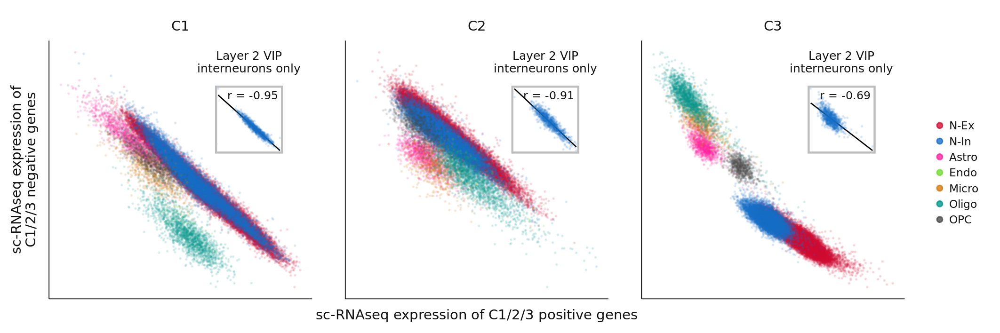

In [391]:
%%R -i sc_projected_posneg_plot -w 180 -h 60 -u mm -r 300
source("../code/fig2_plots.R")
plot_singlecell <- sc_projected_posneg_plot %>% plot_single_cell_posneg()
plot_singlecell

### Brainspan mapping

In [270]:
hcp_bs_mapping = get_hcp_bs_mapping_v2()

In [272]:
bs_exp, bs_col, bs_row = get_brainspan()
bs_clean = clean_brainspan(bs_exp, bs_col, bs_row, hcp_bs_mapping)
bs_agg = aggregate_brainspan_by_age(bs_clean)

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [273]:
bs_clean.groupby(['donor_id', 'age']).size().loc[lambda x: x>3].sort_index(level=1).shape

(35,)

### Brainspan development

In [284]:
hcp_mapped_scores = get_mapped_scores(dme_3d_ds5, hcp_bs_mapping)
bs_scores = compute_brainspan_scores(bs_agg, dme_3d_ds5)

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [285]:
age_groups = get_age_groups()
bs_scores_corr = correlate_brainspan_scores(bs_scores, hcp_mapped_scores, age_groups=age_groups)

In [286]:
bs_scores_corr.sort_values('age')

,age,C,corr
0,Pre-Birth,C1,0.736839
3,Pre-Birth,C2,0.663469
6,Pre-Birth,C3,0.288384
1,Birth-13 yrs,C1,0.875443
4,Birth-13 yrs,C2,0.910635
7,Birth-13 yrs,C3,0.471164
2,18-40 yrs,C1,0.957712
5,18-40 yrs,C2,0.883488
8,18-40 yrs,C3,0.838795


### Brainspan adult correlation

In [287]:
both_scores, both_corrs = combine_scores(bs_scores, hcp_mapped_scores, age_groups)

In [288]:
scores_plot = make_brain_plots(dme_3d_ds5, hcp_bs_mapping, bs_scores).replace({'version':{'BrainSpan':'BrainSpan 18-40yrs'}})

`geom_smooth()` using formula = 'y ~ x'


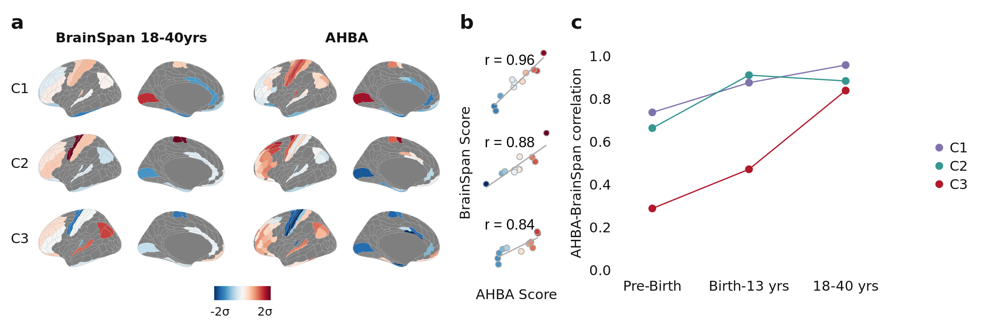

In [424]:
%%R -w 180 -h 60 -u mm -r 300 -i hcp_bs_mapping -i both_scores -i both_corrs -i scores_plot -i bs_scores_corr
source("../code/fig2_plots.R")

plot_brains <- plot_brain_maps(scores_plot,  switch='y') + theme(
            legend.position=c(.5,-.15),
            legend.direction='horizontal',
            panel.spacing.y = unit(2, 'mm')
            )

plot_scatter <- plot_ahba_bs_scatter(both_scores, both_corrs)
plot_dev_corr <- plot_bs_scores_corr(bs_scores_corr)

layout <- c(
    area(t=1,b=1,l=1,r=95),
    area(t=1,b=1,l=96,r=110),
    area(t=1,b=1,l=111,r=180)
)

plot <- plot_brains + plot_scatter + plot_dev_corr + plot_layout(design=layout)

plot_brainspan = plot + plot_annotation(tag_level='a')
plot_brainspan

### Age curves

In [337]:
curves = get_brainspan_curves_by_gene(genes=weights.index)

In [347]:
quantile_curves = get_quantile_curves(weights, curves)
# quantile_curves

,C,C_quantile,age_log10,pred
0,C1,0,1.748188,1.182044
1,C1,0,1.772677,1.189021
2,C1,0,1.797166,1.195994
3,C1,0,1.821655,1.202954
4,C1,0,1.846144,1.209891
...,...,...,...,...
2995,C3,9,4.074647,1.418555
2996,C3,9,4.099136,1.423915
2997,C3,9,4.123625,1.429284
2998,C3,9,4.148114,1.434654


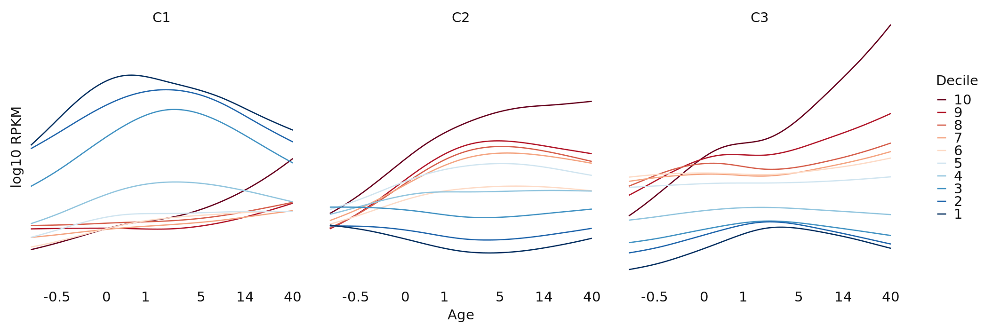

In [419]:
%%R -i quantile_curves -w 180 -h 60 -u mm -r 300
source("../code/fig2_plots.R")
plot_curves <- quantile_curves %>% plot_quantile_curves()
plot_curves

## Combined Fig 2

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


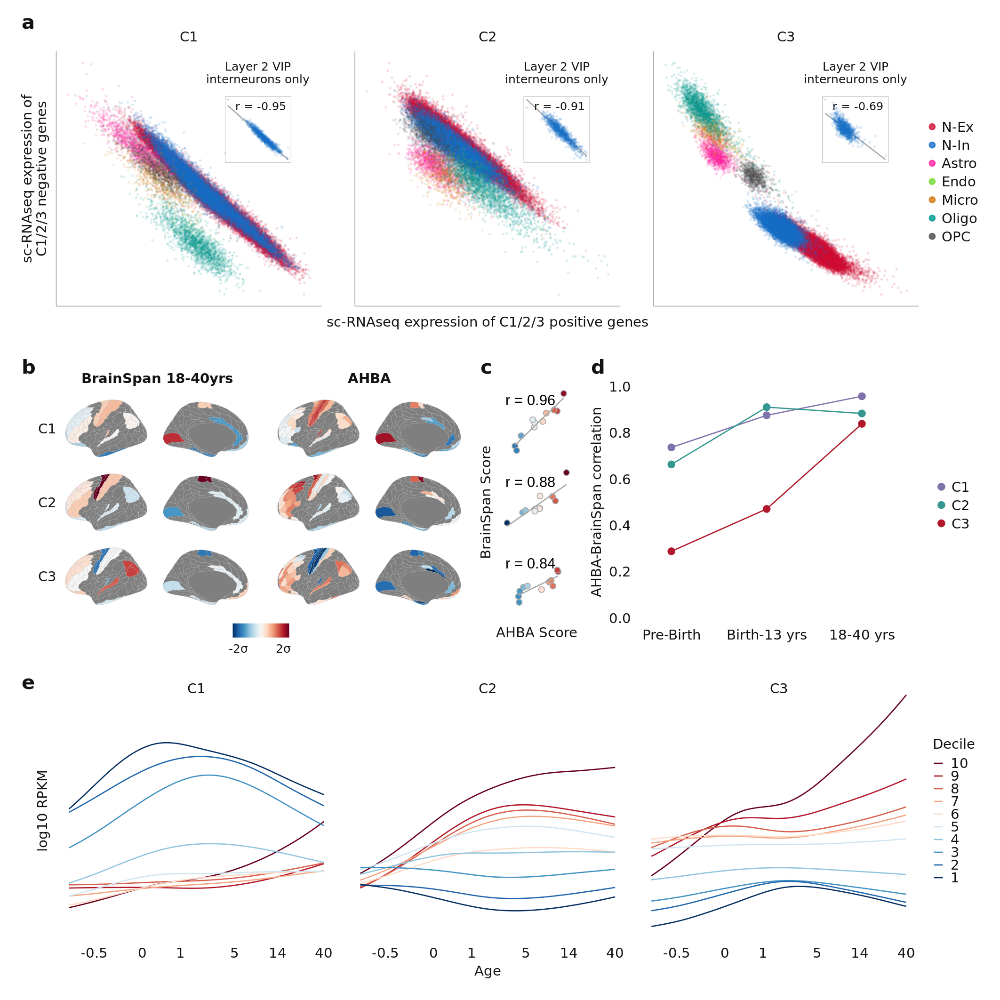

In [425]:
%%R -w 180 -h 180 -u mm -r 300 -i sc_projected_posneg_plot -i quantile_curves
source("../code/fig2_plots.R")

plot_singlecell <- sc_projected_posneg_plot %>% plot_single_cell_posneg()
plot_brainspan <- plot_brainspan & theme(plot.tag.position=c(0,.95))
plot_curves <- quantile_curves %>% plot_quantile_curves()

design <- c(
    area(t=1,   b=60,  l=1, r=180),
    area(t=61,  b=120, l=1, r=180),
    area(t=121, b=180, l=1, r=180)
)
    
plot <- plot_singlecell + plot_brainspan + plot_curves + plot_layout(design=design)

themed <- plot & theme(legend.margin = margin(0,0,0,-2,'mm'))

annotated <- themed + plot_annotation(tag_level='a')
annotated

---

# Fig 3

In [168]:
maps_with_scores = (get_maps()
                   .join(dme_3d_ds5.clean_scores().set_index('label'))
                   .apply(lambda x: (x-np.mean(x))/np.std(x))
)

maps_for_scatter = (maps_with_scores.join(get_mesulam_ve_yeo()))
                    # .join(pd.read_csv("../data/yeo_asymmetric.csv").set_index('label'))
                    # .drop("Yeo_names", axis=1).rename({"Yeo_shortnames":"Yeo_names"}, axis=1))
maps_for_scatter

,paquola_FC,T1T2,MEG_theta,glasser_GI,dMT,hill_evo,externopyramidisation,thickness,PC1_neurosynth,G1_fMRI,...,C3,Mesulam,Mesulam_colors,Mesulam_names,Yeo,Yeo_colors,Yeo_names,vonEconomo,vonEconomo_colors,vonEconomo_names
label,,,,,,,,,,,,,,,,,,,,,
V1,1.820896,1.977036,-0.914991,-1.523300,-1.694981,-2.446501,1.769126,-2.310289,0.261369,-0.750526,...,-1.905834,1,#80B1D3,Idi.,1,#660066,VIS,5,#fffb00,Sensory 1
MST,0.863636,1.575121,-0.609940,-0.392062,-0.450940,0.067569,0.630473,-0.815568,-0.536989,-1.042511,...,NaN,2,#FB8072,Uni.,1,#660066,VIS,4,#f59505,Sensory 2
V6,1.315350,1.647248,-1.100668,-0.755553,0.087768,-1.870358,-1.006875,-1.721457,0.056781,-1.135492,...,NaN,2,#FB8072,Uni.,1,#660066,VIS,4,#f59505,Sensory 2
V2,2.056486,1.665496,-0.949788,-1.113092,-1.109890,-2.070317,1.377546,-2.030079,0.056781,-0.933047,...,-1.487690,1,#80B1D3,Idi.,1,#660066,VIS,4,#f59505,Sensory 2
V3,1.928231,1.430449,-1.103299,-0.421922,-0.600836,-1.813154,1.888340,-1.497054,0.056781,-0.953694,...,-1.299321,1,#80B1D3,Idi.,1,#660066,VIS,4,#f59505,Sensory 2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
STSva,-0.543768,-0.795757,-0.223971,-0.482769,2.206353,1.189967,1.400205,0.205376,1.234535,1.434124,...,0.270334,2,#FB8072,Uni.,7,#FF6666,DMN,2,#220ced,Association 1
TE1m,-1.377902,-0.634758,-0.239697,0.461361,1.392075,1.581797,-0.677230,1.084687,0.056781,1.611986,...,0.810202,4,#BEBADA,Het.,7,#FF6666,DMN,2,#220ced,Association 1
PI,-0.747427,-1.391843,-0.169800,-1.762716,0.175215,-0.268852,-1.012710,-0.240927,0.056781,-0.607650,...,-0.044681,1,#FFFFB3,Par.,4,#FF00FF,CAN,3,#067a08,Association 2


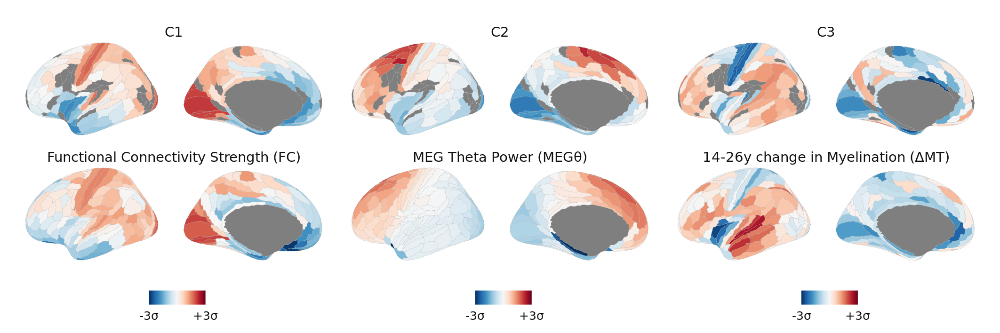

In [195]:
%%R -i maps_with_scores -w 180 -h 60 -u mm -r 300
source("../code/fig3_plots.R")

rename_list <- list(
    `C1` = 'C1', 
    `C2` = 'C2', 
    `C3` = 'C3',
    `Functional Connectivity Strength (FC)` = 'paquola_FC',
    `MEG Theta Power (MEGθ)` = 'MEG_theta',
    `14-26y change in Myelination (ΔMT)` = 'dMT'
) %>% unlist

g1 <- maps_with_scores %>% select_(.dots = rename_list[c(1,4)]) %>% plot_brain_maps
g2 <- maps_with_scores %>% select_(.dots = rename_list[c(2,5)]) %>% plot_brain_maps
g3 <- maps_with_scores %>% select_(.dots = rename_list[c(3,6)]) %>% plot_brain_maps

plot_brains <- (g1 + g2 + g3)
plot_brains


In [170]:
scores = dme_3d_ds5.clean_scores()
null_scores = np.load("../outputs/permutations/dme_3d_ds5_clean_spin_41k_5000.npy")

maps_to_test = ['paquola_FC','MEG_theta','dMT']
map_corrs = corr_nulls_from_grads(null_scores, scores, maps_with_scores.loc[:,maps_to_test])#, adjust_by_label=True)
map_corrs

,C,map,r,p,q
0,C1,paquola_FC,0.778985,0.000600,0.005399
1,C1,MEG_theta,-0.179367,0.740252,0.984803
2,C1,dMT,0.166173,0.605079,0.984803
3,C2,paquola_FC,-0.013898,0.982204,0.984803
4,C2,MEG_theta,0.781396,0.008598,0.026395
5,C2,dMT,0.152591,0.672066,0.984803
6,C3,paquola_FC,-0.004556,0.984803,0.984803
7,C3,MEG_theta,-0.015271,0.960808,0.984803
8,C3,dMT,0.430189,0.008798,0.026395


In [171]:
scores = dme_3d_ds5.clean_scores()
null_scores = np.load("../outputs/permutations/hcp_3d_ds5_spin_5000.npy")

map_corrs_all = corr_nulls_from_grads(null_scores, scores, maps_with_scores.drop(['C1','C2','C3'], axis=1))#, adjust_by_label=True)
map_corrs_all

IndexError: boolean index did not match indexed array along dimension 0; dimension is 137 but corresponding boolean dimension is 180

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


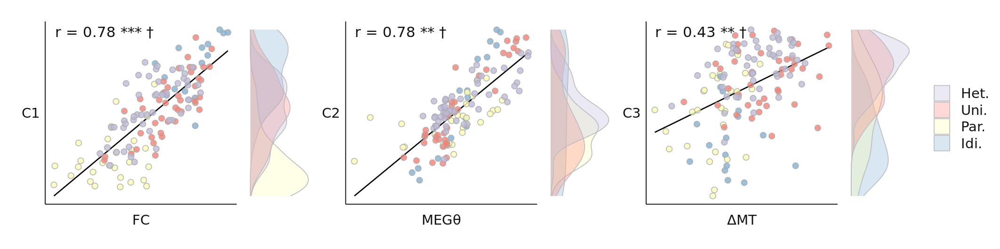

In [174]:
%%R -i maps_for_scatter -i map_corrs -w 180 -h 45 -u mm -r 300
source("../code/fig3_plots.R")

g41 <- maps_for_scatter %>% plot_scatter_with_colors(corrs=map_corrs, x_name='FC', x_var='paquola_FC', y_var='C1', color_var='Mesulam', left_margin=0)
g42 <- maps_for_scatter %>% plot_scatter_with_colors(corrs=map_corrs, x_name='MEGθ', x_var='MEG_theta', y_var='C2', color_var='Mesulam')
g43 <- maps_for_scatter %>% plot_scatter_with_colors(corrs=map_corrs, x_name='ΔMT', x_var='dMT', y_var='C3', color_var='Mesulam') 

scatters1 <- (
    g41 + plot_layout(tag_level='new') | 
    g42 + plot_layout(tag_level='new') | 
    g43 + plot_layout(tag_level='new')
) + plot_layout(ncol=3, guides='collect')

plot_scatters <- (scatters1 & theme(legend.position = 'right')) + plot_annotation(tag_level='a')
plot_scatters 

## Mesulam

In [155]:
scores = dme_3d_ds5.clean_scores()
mesulam_ve_yeo = (pd.read_csv('../data/mesulam_ve_yeo.csv', index_col=0).join(scores.set_index('label'), on='label')
                  .loc[lambda x: x['Mesulam']!=0])
true_means, null_means = compute_region_means(scores, null_scores, mesulam_ve_yeo['Mesulam'], method='mean')
mesulam_scores_sig = compute_null_p(true_means, null_means, adjust='fdr_bh').assign(label=lambda x: x['label'].astype('string'))
mesulam_colors = (mesulam_ve_yeo.loc[:,['Mesulam', 'Mesulam_names', 'Mesulam_colors']].set_axis(['label','name','color'],axis=1)
                  .drop_duplicates().assign(label=lambda x: x['label'].astype('string')))
mesulam_scores_sig = mesulam_scores_sig.join(mesulam_colors.set_index('label'), on='label')

In [158]:
%%R -w 48 -h 8 -u cm -r 100 -i mesulam_ve_yeo -i mesulam_scores_sig
source("../code/Rplots.R")

design <- c(
  area(t = 1, b = 8, l = 1, r = 20),
  area(t = 1, b = 8, l = 21, r = 48)
)

mesulam1 <- plot_hcp_classes(mesulam_ve_yeo, classes=Mesulam, classcolors=Mesulam_colors, classnames=Mesulam_names, ncol=4) +
    ggtitle('Laminar Differentiation Regions') + 
    theme(legend.position='none', 
          plot.title=element_text(hjust=0.5, size=20, color='grey7', family='Calibri',margin=margin(b=-50)),
          )
mesulam2 <- plot_atlas_violins(mesulam_ve_yeo, mesulam_scores_sig) + plot_layout(tag_level='new')

plot_mesulam <- mesulam1 + mesulam2 + plot_layout(design=design)
plot_mesulam

RRuntimeError: Error: node stack overflow


## Corrmat

In [175]:
corrmat = make_correlation_matrix(maps_with_scores
                                  .drop(['paquola_FC','MEG_theta', 'dMT'], axis=1),
            gamma=.8, seed=1, method='pearson', cluster_reorder_dict={3:2,2:3})

n clusters 3


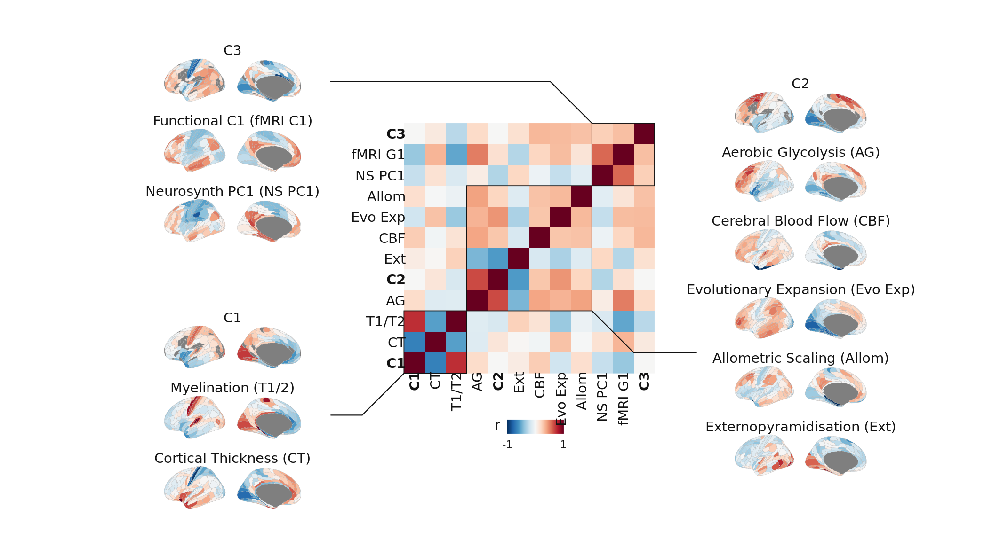

In [196]:
%%R -i maps_with_scores -i corrmat -w 180 -h 100 -u mm -r 300
source("../code/fig3_plots.R")

rename_list <- list(
    `C3` = 'C3',
    `Functional C1 (fMRI C1)` = 'G1_fMRI',
    `Neurosynth PC1 (NS PC1)` = 'PC1_neurosynth',

    `C1` = 'C1',
    `Myelination (T1/2)` = 'T1T2',
    `Cortical Thickness (CT)` = 'thickness',
    
    `C2` = 'C2',
    `Aerobic Glycolysis (AG)` = 'glasser_GI',
    `Cerebral Blood Flow (CBF)` = 'CBF',
    `Evolutionary Expansion (Evo Exp)` = 'hill_evo',
    `Allometric Scaling (Allom)` = 'allom',
    `Externopyramidisation (Ext)` = 'externopyramidisation'
) %>% unlist

p_corrmat <- plot_corrmat(corrmat) +
    theme(
        plot.margin = margin(t=18, b=18, l=0, r=0, unit='mm'),
        legend.position = c(.5,-.25),
        legend.direction = 'horizontal'
    )

# p_corrmat

maps_C3 <- maps_with_scores %>% select_(.dots = rename_list[c(1:3)]) %>% 
            plot_brain_maps() + theme(legend.position='none')
maps_C1 <- maps_with_scores %>% select_(.dots = rename_list[c(4:6)]) %>% 
            plot_brain_maps() + theme(legend.position='none')
maps_C2 <- maps_with_scores %>% select_(.dots = rename_list[c(7:12)]) %>% 
            plot_brain_maps() + theme(legend.position='none')


library(grid)
line_lr <- linesGrob(gp = gpar(col = "grey7", lwd = .7))
line_rl <- linesGrob(gp = gpar(col = "grey7", lwd = .7), y = c(1,0))

p_corrmat_and_lines <- 
    p_corrmat + 
    # C3 lines
    annotation_custom(grob=line_rl, xmin=9.5, xmax=7.5, ymin=12.5, ymax=14.5) +
    annotation_custom(grob=line_rl, xmin=7.5, xmax=-3, ymin=14.5, ymax=14.5) +
    # annotation_custom(grob=line_rl, xmin=-3.5, xmax=-3.5, ymin=6.5, ymax=15.5) +
    # C1 lines
    annotation_custom(grob=line_lr, xmin=0.5, xmax=-1.5, ymin=0.5, ymax=-1.5) +
    annotation_custom(grob=line_lr, xmin=-1.5, xmax=-3, ymin=-1.5, ymax=-1.5) +
    # annotation_custom(grob=line_rl, xmin=-3.5, xmax=-3.5, ymin=-4.5, ymax=4) +
    # C2 lines
    # annotation_custom(grob=line_rl, xmin=9.5, xmax=14.5, ymin=6.5, ymax=6.5)
    annotation_custom(grob=line_rl, xmin=9.5, xmax=11.5, ymin=3.5, ymax=1.5) +
    annotation_custom(grob=line_rl, xmin=11.5, xmax=14.5, ymin=1.5, ymax=1.5) 

p_corrmat_and_maps <- (
    p_corrmat_and_lines + plot_layout(tag_level='new') +
    # Brain maps
    inset_element(maps_C3, left=-.6, right=0, bottom=.6, top=1.2, align_to = 'plot') + 
    inset_element(maps_C1, left=-.6, right=0, bottom=-.2, top=.4, align_to = 'plot') +
    inset_element(maps_C2, left=1.1, right=1.7, bottom=-.1, top=1.1, align_to = 'plot')
)

p_corrmat_and_maps

## Combined Fig 3

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


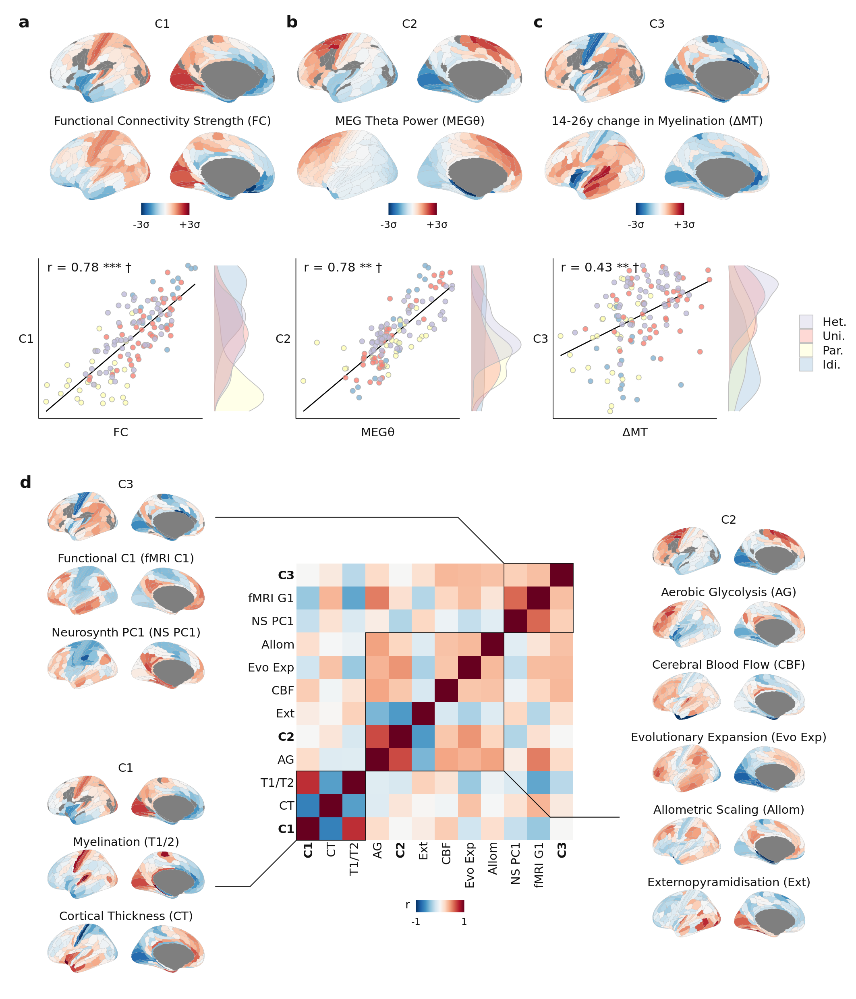

In [183]:
%%R -w 180 -h 210 -u mm -r 300

plot_brains <- plot_brains & theme(
  legend.margin = margin(t=-4, b=4, l=0, r=0, unit='mm')
  )

design <- c(
  area(t = 1, b = 60, l = 1, r = 180),
  area(t = 61, b = 110, l = 1, r = 180),
  area(t = 116, b = 210, l = 2, r = 179)
)

library(grid)
tag_d <- grid.text(label='d', hjust=0, 
    gp=gpar(col="grey7", fontsize=10, fontface='bold', fontfamily='Calibri'))

plot <- plot_brains / plot_scatters / p_corrmat_and_maps + plot_layout(design=design) +
    inset_element(tag_d, left=-.12, right=-.12, top=1.25, bottom=1.25)

plot + plot_annotation(tag_level='a')

---

# Fig 4

### Brainchart disorder maps

In [398]:
brainchart_maps = get_disorder_maps().loc[:,['ASD','MDD','SCZ']].apply(lambda x: (x-np.mean(x))/np.std(x)) * -1
# brainchart_maps_plot = brainchart_maps.apply(lambda x: (x-np.mean(x))/np.std(x))

In [369]:
brainchart_maps.describe()

,ASD,MDD,SCZ
count,3.400000e+01,3.400000e+01,3.400000e+01
mean,-9.632817e-17,-6.040919e-16,3.526591e-16
std,1.015038e+00,1.015038e+00,1.015038e+00
min,-2.391059e+00,-2.660308e+00,-2.455864e+00
25%,-5.924749e-01,-3.890258e-01,-6.971452e-01
50%,7.161784e-02,1.178866e-02,7.174201e-02
75%,5.281816e-01,5.462080e-01,6.285224e-01
max,1.870202e+00,2.149466e+00,1.750921e+00


In [387]:
dk_scores = dme_3d_ds5.score_in_dk()
# dk_scores = dm_ds8.score_in_dk()

In [401]:
brainchart_maps_and_scores = pd.concat([brainchart_maps,dk_scores.set_index('label')], axis=1)

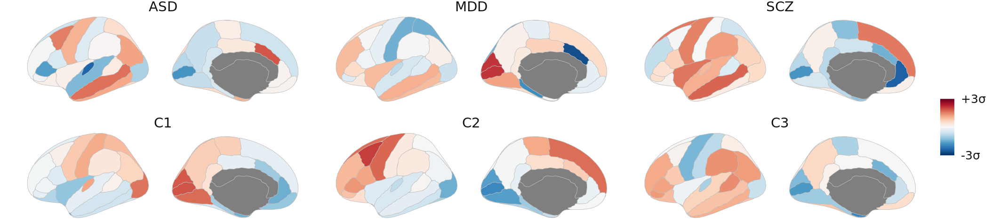

In [402]:
%%R -w 180 -h 40 -u mm -r 300 -i brainchart_maps_and_scores
source("../code/fig4_plots.R")
plot_brainchart <- plot_brains(brainchart_maps_and_scores, ncol=3)
plot_brainchart

### Brainchart disorder heatmap

In [374]:
# dk_null_grads = np.load(f"../outputs/permutations/dme_3d_ds5_clean_spin_41k_5000_v2_dk.npy")
# dk_null_grads = np.load(f"../outputs/permutations/dme_3d_ds5_clean_in_dk_spin_41k_5000.npy")
dk_null_grads = np.load(f"../outputs/permutations/spin_dk_5000_dm_hcp_3d_ds5_vertices.npy")
# dk_null_grads = np.load(f"../outputs/permutations/hcp_3d_ds5_spin_5000_v2_in_dk.npy")

In [390]:
corrs = brainchart_maps_and_scores.corr().iloc[:3,3:]
brainchart_null_p = corr_nulls_from_grads(dk_null_grads, dk_scores, brainchart_maps, method='pearsonr', reindex=False)
brainchart_null_p

,C,map,r,p,q
0,C1,ASD,-0.473221,0.000200,0.001800
1,C1,MDD,0.284352,0.135773,0.305489
2,C1,SCZ,-0.003683,0.991002,0.991002
3,C2,ASD,0.274703,0.000800,0.003599
4,C2,MDD,-0.216468,0.239952,0.431914
5,C2,SCZ,0.239560,0.581084,0.747108
6,C3,ASD,0.084600,0.735053,0.826935
7,C3,MDD,0.124239,0.555889,0.747108
8,C3,SCZ,0.433064,0.008198,0.024595


### GWAS & DEGs

In [404]:
# weights = dme_ibf0_3d_ds6.weights
# null_weights = shuffle_gene_weights(weights, n=5000)
weights = dme_3d_ds5.weights
null_weights = shuffle_gene_weights(weights, n=5000)

In [405]:
gwas_genes = get_gwas_combined() #.loc[lambda x: x['label']!='MDD']
gwas_stats = compute_null_p(*compute_enrichments(weights, null_weights, gwas_genes), adjust_by_label=True)
gwas_stats

,label,C,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,ASD,C1,0.9868,0.140449,-0.032014,0.077000,2.239775,True,0.0264,0.0396,True,235,56
1,ASD,C2,0.0102,-0.071447,0.027410,0.041853,-2.361979,False,0.0204,0.0396,True,235,56
2,ASD,C3,0.6702,0.022407,0.007040,0.034171,0.449708,True,0.6596,0.6596,False,235,56
3,MDD,C1,0.9362,0.045151,-0.032761,0.051163,1.522801,True,0.1276,0.1914,False,269,130
4,MDD,C2,0.0414,-0.021013,0.026097,0.026940,-1.748681,False,0.0828,0.1914,False,269,130
5,MDD,C3,0.7994,0.025387,0.007225,0.022212,0.817701,True,0.4012,0.4012,False,269,130
6,SCZ,C1,0.9828,0.049491,-0.032034,0.039614,2.057976,True,0.0344,0.0516,False,562,212
7,SCZ,C2,0.0484,-0.009449,0.026557,0.021464,-1.677532,False,0.0968,0.0968,False,562,212
8,SCZ,C3,0.9972,0.057396,0.006708,0.017553,2.887753,True,0.0056,0.0168,True,562,212


In [406]:
deg_genes = get_deg_consensus()
deg_stats = compute_null_p(*compute_enrichments(weights, null_weights, deg_genes))
deg_stats

,label,C,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,ASD,C1,1.0000,0.065248,-0.032599,0.019330,5.061958,True,0.0000,0.000000,True,1456,824
1,ASD,C2,1.0000,0.078126,0.026922,0.010534,4.860644,True,0.0000,0.000000,True,1456,824
2,ASD,C3,0.2762,0.001755,0.006794,0.008579,-0.587316,False,0.5524,0.718457,False,1456,824
3,MDD,C1,0.0022,-0.199171,-0.033222,0.060024,-2.764713,False,0.0044,0.013200,True,182,92
4,MDD,C2,0.7206,0.045429,0.026437,0.032393,0.586316,True,0.5588,0.718457,False,182,92
5,MDD,C3,0.0606,-0.034605,0.007064,0.026747,-1.557890,False,0.1212,0.218160,False,182,92
6,SCZ,C1,0.3948,-0.040594,-0.032223,0.031066,-0.269451,False,0.7896,0.888300,False,506,336
7,SCZ,C2,0.5262,0.027975,0.027082,0.016943,0.052693,True,0.9476,0.947600,False,506,336
8,SCZ,C3,0.9936,0.041186,0.006792,0.013843,2.484503,True,0.0128,0.028800,True,506,336


### Heatmaps plot

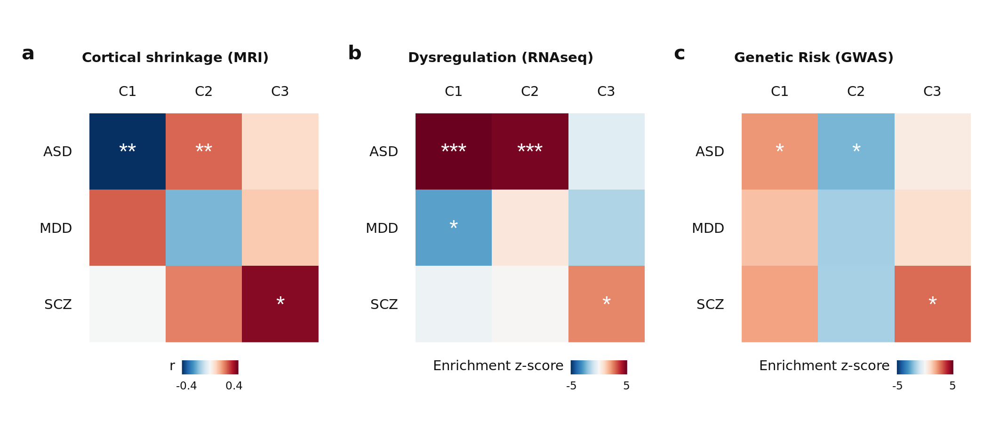

In [427]:
%%R -w 180 -h 80 -u mm -r 300 -i brainchart_null_p -i deg_stats -i gwas_stats
source("../code/fig4_plots.R")

g1 <- plot_heatmap_maps(brainchart_null_p) + ggtitle('Cortical shrinkage (MRI)')
    # theme(plot.tag.position = c(-.1, .95), plot.title=element_text(hjust=0.5))
g2 <- plot_heatmap_enrichments(deg_stats, limits=5.1) + ggtitle('Dysregulation (RNAseq)') 
    # theme(plot.tag.position = c(0, .95), plot.title=element_text(hjust=0.5))
g3 <- plot_heatmap_enrichments(gwas_stats, limits=5.1) + ggtitle('Genetic Risk (GWAS)') 
    # theme(plot.tag.position = c(0, .95), plot.title=element_text(hjust=0.7))

plot_heatmaps <- (g1 + g2 + g3) & theme(legend.margin = margin(t=-2, r=0, b=0, l=0, "mm"))

plot_heatmaps + plot_annotation(tag_level='a')

### Brainchart disorder scatters

In [57]:
brainchart_scatter = (brainchart_maps
                .melt(ignore_index=False, var_name='map', value_name='map_score')
                .join(dk_scores.set_index('label')).reset_index()
                .set_index(['label','map','map_score'])
                .melt(ignore_index=False, var_name='G',value_name='G_score')
                .reset_index()
               )

brainchart_scatter_corrs = brainchart_null_p.loc[:,['map','G','r','q']]

In [58]:
%%R -w 20 -h 8 --units in -r 100 -i brainchart_maps -i dk_scores -i brainchart_null_p -i brainchart_scatter -i brainchart_scatter_corrs
source("../code/plot_maps.R")
source("../code/brainPlots.R")

g1a <- plot_maps_dk(brainchart_maps, ncol=1)
g1b <- plot_dk(dk_scores, facet='w')

g2a <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G1'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G1'), x=.5, y=-1.5, facet=F)
g2b <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G2'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G2'), x=.5, y=-1.5, facet=F) #+ plot_layout(tag_level='new')
g2c <- plot_maps_scatter(brainchart_scatter %>% filter(map=='SCZ', G=='G3'), brainchart_scatter_corrs %>% filter(map=='SCZ', G=='G3'), x=.5, y=-1.5, facet=F) #+ plot_layout(tag_level='new')
g3 <- plot_map_corrs(brainchart_null_p, size=6.5) #+ plot_layout(tag_level='new')

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


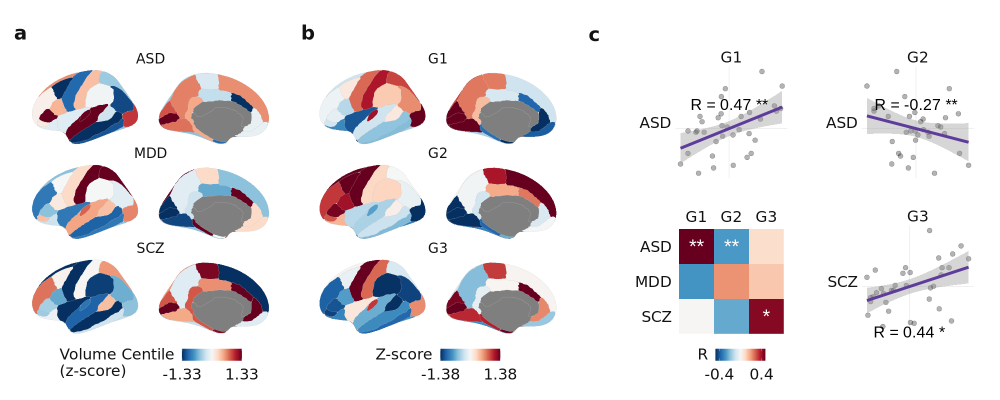

In [59]:
%%R -w 20 -h 8 --units in -r 100 -i brainchart_maps -i dk_scores -i brainchart_null_p -i brainchart_scatter -i brainchart_scatter_corrs
source("../code/plot_maps.R")
source("../code/brainPlots.R")

g1a <- plot_maps_dk(brainchart_maps, ncol=1, name='Volume Centile\n(z-score)') + theme(plot.tag.position=c(0,.95))
g1b <- plot_maps_dk(dk_scores %>% remove_rownames() %>% column_to_rownames('label'), ncol=1) + theme(plot.tag.position=c(0,.95))

g2a <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G1'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G1'), 
                         x=0, y=1, facet=F, xlab='G1', ylab='ASD') + theme(plot.tag.position=c(0,.88))
g2b <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G2'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G2'), 
                         x=0, y=1, facet=F, xlab='G2', ylab='ASD') + plot_layout(tag_level='new')
g2c <- plot_maps_scatter(brainchart_scatter %>% filter(map=='SCZ', G=='G3'), brainchart_scatter_corrs %>% filter(map=='SCZ', G=='G3'), 
                         x=0, y=-2, facet=F, xlab='G3', ylab='SCZ') + plot_layout(tag_level='new')
g3 <- plot_map_corrs(brainchart_null_p, size=10) + plot_layout(tag_level='new')

g4 <- plot_spacer()

layout <- c(
    area(t=1,b=48,l=1,r=16),
    area(t=1,b=48,l=17,r=32),    
    
    area(t=1,b=24,l=33,r=40),
    area(t=1,b=24,l=41,r=48),
    area(t=25,b=48,l=41,r=48),
    
    area(t=25,b=48,l=33,r=40)
)

plot <- g1a + g1b + g2a + g2b + g2c + g3 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)
# themed

plot_brainchart <- themed + plot_annotation(tag_level='a')
plot_brainchart

In [21]:
brainchart_null_p

,G,map,r,p,q
0,G1,ASD,0.473487,0.000200,0.001800
1,G1,MDD,-0.283792,0.137772,0.309988
2,G1,SCZ,0.003604,0.991202,0.991202
3,G2,ASD,-0.274484,0.000800,0.003599
4,G2,MDD,0.214393,0.244151,0.439472
5,G2,SCZ,-0.242311,0.575085,0.739395
6,G3,ASD,0.081871,0.743451,0.836383
7,G3,MDD,0.129680,0.540092,0.739395
8,G3,SCZ,0.435320,0.007798,0.023395


### SCZ supragranular

In [408]:
hcp_scores = dme_3d_ds5.clean_scores()

In [410]:
scz_diff = get_scz_gyral_sulcal()
scz_diff_brain = scz_diff.join(dme_3d_ds5.clean_scores().set_index('label')['C3'])

scores_melt = dme_3d_ds5.clean_scores().set_index('label').melt(ignore_index=False)
scz_diff_scatter = (scz_diff
                    .join(scores_melt)
                    .set_axis(['map_score','C','C_score'], axis=1)
                    .assign(map = 'SCZ L2-Specific Thinning')
                    )
scz_diff_scatter

,map_score,C,C_score,map
label,,,,
1,-0.712678,C1,1.459762,SCZ L2-Specific Thinning
1,-0.712678,C2,0.540152,SCZ L2-Specific Thinning
1,-0.712678,C3,-0.947282,SCZ L2-Specific Thinning
10d,-0.500203,NaN,NaN,SCZ L2-Specific Thinning
10pp,-0.589750,NaN,NaN,SCZ L2-Specific Thinning
...,...,...,...,...
s32,-0.856272,C1,-1.406180,SCZ L2-Specific Thinning
s32,-0.856272,C2,-0.402071,SCZ L2-Specific Thinning
s32,-0.856272,C3,-0.076738,SCZ L2-Specific Thinning


In [411]:
nulls = np.load('../outputs/permutations/dme_3d_ds5_clean_spin_41k_5000.npy')
null_corrs = corr_nulls_from_grads(nulls, hcp_scores, scz_diff)
scz_diff_corrs = null_corrs.reset_index().rename({'level_0':'C', 'level_1':'map'}, axis=1)
scz_diff_corrs

,index,C,map,r,p,q
0,0,C1,SCZ L2-Specific Thinning,0.130787,0.760248,0.760248
1,1,C2,SCZ L2-Specific Thinning,-0.151209,0.752849,0.760248
2,2,C3,SCZ L2-Specific Thinning,0.551509,0.002400,0.007199


/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: UserWarning: DataFrame contains duplicated elements in the index, which will lead to loss of the row names in the resulting data.frame
  warnings.warn('DataFrame contains duplicated elements in the index, '



`geom_smooth()` using formula = 'y ~ x'


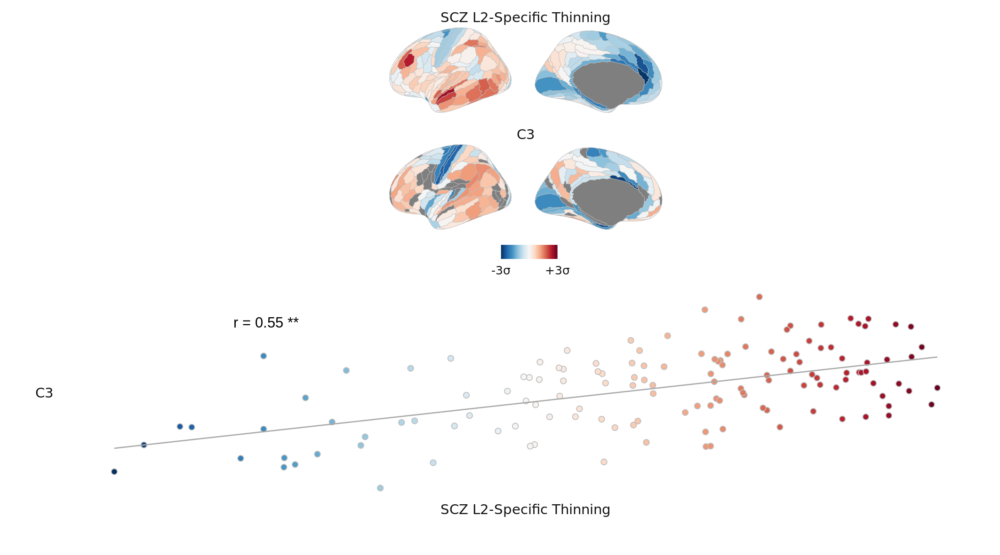

In [412]:
%%R -w 180 -h 100 -u mm -r 300 -i scz_diff_brain -i hcp_scores -i scz_diff_scatter -i scz_diff_corrs
source("../code/fig4_plots.R")

plot_scz_brain <- plot_brains(scz_diff_brain, atlas='glasser', ncol=1) + 
                  guides(fill=guide_colorbar(barwidth=2, barheight=.5, ticks=FALSE, title.vjust=1)) +
                  theme(legend.position='bottom')
plot_scz_scatter <- plot_maps_scatter(
                scz_diff_scatter %>% filter(C=='C3'), 
                scz_diff_corrs   %>% filter(C=='C3'),
                y=1.7, x=-2, switch='both') + plot_layout(tag_level='new')

# g2d = plot_map_corrs(scz_diff_corrs, size=10) + theme(axis.text.y=element_blank()) + plot_layout(tag_level='new')

plot_scz <- plot_scz_brain / plot_scz_scatter 
plot_scz

### Venn

In [413]:
overlap_deg_gwas = pd.concat({
    'GWAS':gwas_genes,
    'DEG':deg_genes.drop('study',axis=1)
}).reset_index(0).rename({'label':'disorder','level_0':'label'}, axis=1).reset_index(drop=True)

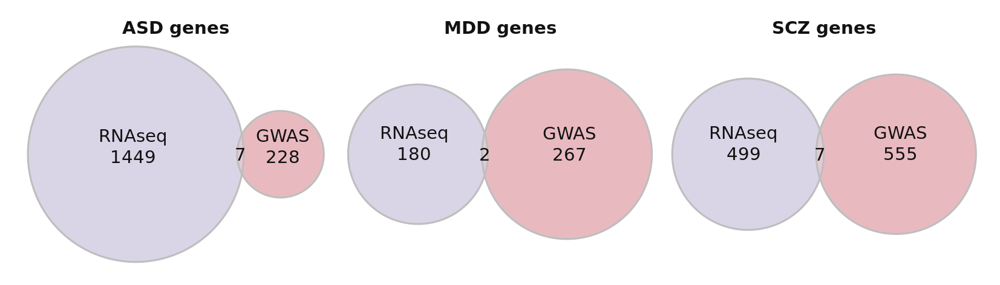

In [414]:
%%R -i overlap_deg_gwas -w 140 -h 40 -u mm -r 300
source("../code/fig4_plots.R")
plot_overlaps <-  plot_venn(overlap_deg_gwas, disorder='ASD') + 
            (plot_venn(overlap_deg_gwas, disorder='MDD') + plot_layout(tag_level='new')) +
            (plot_venn(overlap_deg_gwas, disorder='SCZ') + plot_layout(tag_level='new'))

plot_overlaps

### SCZ quantiles

In [417]:
scz_genes = overlap_deg_gwas.loc[lambda x: x['disorder']=='SCZ']
quantiles = make_label_quantiles_by_axis(weights, scz_genes, q=5)

In [418]:
scz_genes = overlap_deg_gwas.loc[lambda x: x['disorder']=='SCZ']
curves = get_brainspan_curves_by_gene(scz_genes['gene'])
quantile_curves_disorders = aggregate_disorder_gene_quantiles_over_development(quantiles, curves)

In [419]:
layers = get_layer_genes()
quantile_layers_disorders = aggregate_disorder_gene_quantiles_over_layers(quantiles, layers)

In [420]:
quantile_curves_disorders

,label,C,C_quantile,age_log10,pred
1000,SCZ RNAseq,C3,1,1.748188,0.531977
1001,SCZ RNAseq,C3,1,1.772677,0.541305
1002,SCZ RNAseq,C3,1,1.797166,0.550640
1003,SCZ RNAseq,C3,1,1.821655,0.559998
1004,SCZ RNAseq,C3,1,1.846144,0.569395
...,...,...,...,...,...
2995,SCZ GWAS,C3,5,4.074647,1.522491
2996,SCZ GWAS,C3,5,4.099136,1.528165
2997,SCZ GWAS,C3,5,4.123625,1.533837
2998,SCZ GWAS,C3,5,4.148114,1.539501


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


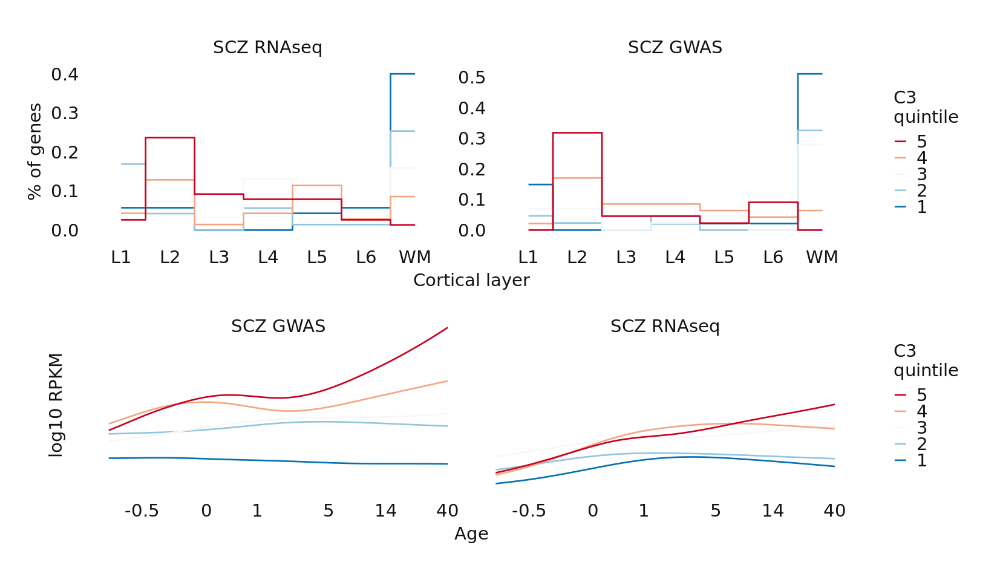

In [422]:
%%R -w 140 -h 80 -u mm -r 300 -i quantile_curves_disorders -i quantile_layers_disorders 
source("../code/fig4_plots.R")

plot_curves <- quantile_curves_disorders %>% 
    mutate(C_quantile=factor(C_quantile, ordered=T, levels=rev(unique(.$C_quantile)))) %>% 
    mutate(data=factor(label, ordered=T, levels=unique(.$label))) %>% 
    plot_quantile_curves(facet='~label')

plot_layers <- quantile_layers_disorders %>% 
    mutate(C_quantile=factor(C_quantile, ordered=T, levels=rev(unique(.$C_quantile)))) %>% 
    mutate(label=factor(label, ordered=T, levels=unique(.$label))) %>% 
    mutate(layer=factor(layer, ordered=T, levels=unique(.$layer))) %>%
    plot_quantile_steps(facet='~label')

plot <- (plot_layers / plot_curves) & 
    # scale_alpha_manual(values=c(rep(0.7,4),1)) &
    scale_color_manual(
        values=rev(brewer.rdbu(5)),
        labels=c('1', '2', '3', '4', '5'), name='C3\nquintile'
        )

plot_scz_quantiles <- plot
plot_scz_quantiles

### Fig

`geom_smooth()` using formula = 'y ~ x'


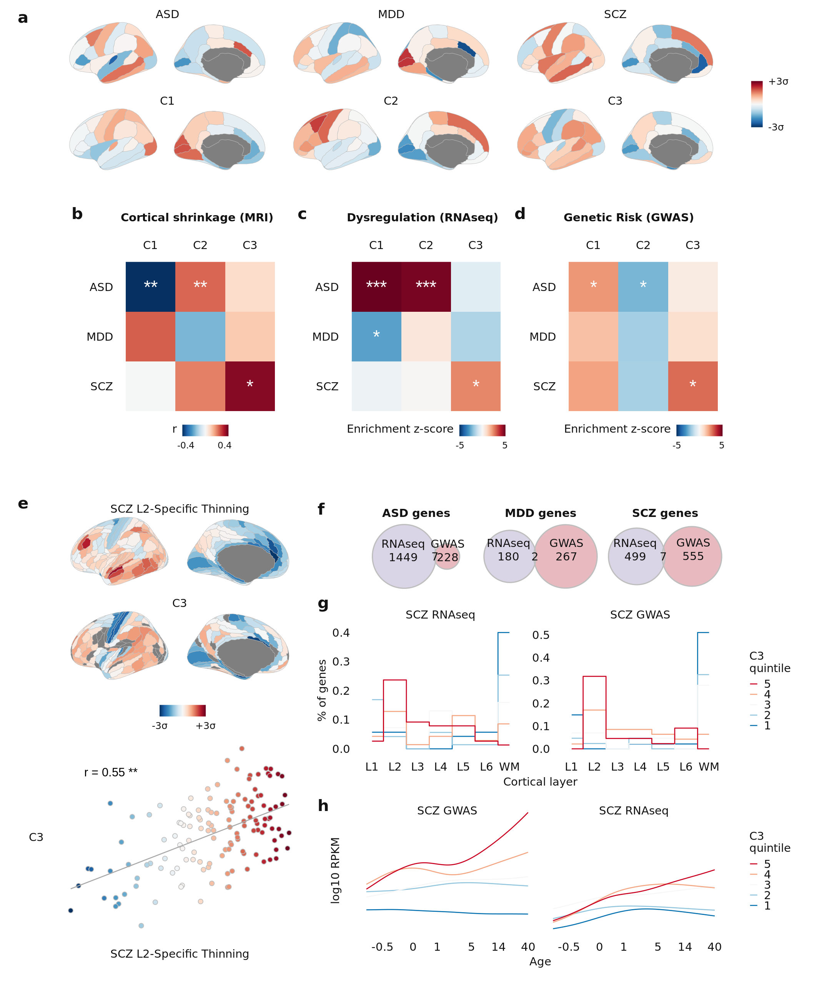

In [433]:
%%R -w 180 -h 220 -u mm -r 300 -i brainchart_null_p
source("../code/fig4_plots.R")

plot_heatmaps <- plot_heatmaps + plot_annotation(theme=theme(plot.margin = margin(0,0,0,-50,'mm')))
plot_scz <- plot_scz + theme(tag.position=c(0,.95))

layout <- c(
    area(t=1,b=45,l=1,r=180),
    area(t=46,b=110,l=2,r=180),
    area(t=111,b=220,l=1,r=60),
    area(t=112,b=130,l=61,r=180),
    area(t=131,b=220,l=61,r=180)
)

plot <- plot_brainchart + plot_heatmaps + plot_scz + plot_overlaps + plot_scz_quantiles + plot_layout(design=layout)
plot + plot_annotation(tag_level='a')

---

# Extended Data Fig 1

### Donor distribution

In [ ]:
counts_hcp = pd.read_csv("../outputs/counts_hcp.csv", index_col=0)
donor_counts = (counts_hcp!=0).sum(axis=1)[:180].rename('count').to_frame().join(get_labels_hcp())
stability = pd.read_csv("../outputs/stability_hcp_ranked.csv", index_col=0).set_index('gene_symbol')

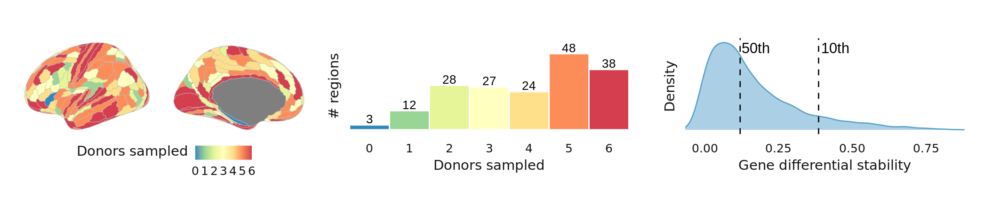

In [ ]:
%%R -i donor_counts -i stability -w 180 -h 40 -u mm -r 300
source("../code/fig_extended.R")

g1 <- plot_donor_counts(donor_counts)
g2 <- plot_donor_counts_histogram(donor_counts) + plot_layout(tag_level='new')
g3 <- plot_gene_stability_density(stability)

plot_distributions <- (g1 | g2 | g3)
plot_distributions

### Raster plot of filtering options

Compute expression data for all triplets, or load from file

In [144]:
# triplets = get_triplets(atlas=fetch_hcp())
# save_pickle(triplets, "triplets")
triplets = load_pickle('triplets')
print("Got base triplets")

# triplets_2donors = get_triplets(atlas=fetch_hcp(), donors_threshold=2)
# save_pickle(triplets_2donors, "triplets_2donors")
triplets_2donors = load_pickle('triplets_2donors')
print("Got 2donors triplets")

# triplets_3donors = get_triplets(atlas=fetch_hcp(), donors_threshold=3)
# save_pickle(triplets_3donors, "triplets_3donors")
triplets_3donors = load_pickle('triplets_3donors')
print("Got 3donors triplets")

Got base triplets
Got 2donors triplets
Got 3donors triplets


Load triplets data from pickles since triplet stability levels are slow to compute

In [145]:
triplets_pca = make_triplet_ds_plot(get_triplets_stability_levels(triplets, approach='pca', kernel=None))
triplets_dme = make_triplet_ds_plot(get_triplets_stability_levels(triplets, approach='dm', kernel='normalized_angle', alpha=1))
triplets_pca_2d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_2donors, approach='pca', kernel=None))
triplets_dme_2d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_2donors, approach='dm', kernel='normalized_angle', alpha=1))
triplets_pca_3d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_3donors, approach='pca', kernel=None))
triplets_dme_3d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_3donors, approach='dm', kernel='normalized_angle', alpha=1))

Computed triplet stability
Computed triplet stability
Computed triplet stability
Computed triplet stability
Computed triplet stability
Computed triplet stability


In [147]:
# triplets_dict = {
#     'PCA, all regions': triplets_pca, 
#     'PCA, only 2+ donor regions': triplets_pca_2d, 
#     'PCA, only 3+ donor regions': triplets_pca_3d,
#     'DME, all regions': triplets_dme,
#     'DME, only 2+ donor regions': triplets_dme_2d,
#     'DME, only 3+ donor regions': triplets_dme_3d
# }

# save_pickle(triplets_dict, 'triplets_dict')
triplets_dict = load_pickle('triplets_dict')

triplets_plot = (pd.concat(triplets_dict)
 .reset_index(0)
 .rename({'level_0':'method', 'version':'DS'}, axis=1)
 .assign(method = lambda x: pd.Categorical(x['method'], ordered=True, categories=triplets_dict.keys()))
                   )
triplets_plot

,method,how,DS,component,pair,corr,corr_abs
0,"PCA, all regions",Region scores,0.0,1,012-345,0.774335,0.774335
1,"PCA, all regions",Region scores,0.0,2,012-345,0.041373,0.041373
2,"PCA, all regions",Region scores,0.0,3,012-345,0.245817,0.245817
3,"PCA, all regions",Region scores,0.0,4,012-345,0.106467,0.106467
4,"PCA, all regions",Region scores,0.0,5,012-345,-0.107603,0.107603
...,...,...,...,...,...,...,...
495,"DME, only 3+ donor regions",Region scores,0.9,1,045-123,0.970999,0.970999
496,"DME, only 3+ donor regions",Region scores,0.9,2,045-123,0.950815,0.950815
497,"DME, only 3+ donor regions",Region scores,0.9,3,045-123,0.927292,0.927292
498,"DME, only 3+ donor regions",Region scores,0.9,4,045-123,0.853620,0.853620


In [148]:
pd.concat(triplets_dict).reset_index(0).groupby(['level_0','how','version','component'])['corr_abs'].median().unstack(2)

version                                                  0.0       0.1  \
level_0                    how           component                       
DME, all regions           Region scores 1          0.779779  0.797595   
                                         2          0.088498  0.130009   
                                         3          0.140212  0.120787   
                                         4          0.209637  0.335881   
                                         5          0.341785  0.362675   
DME, only 2+ donor regions Region scores 1          0.886773  0.892680   
                                         2          0.179735  0.236983   
                                         3          0.202728  0.261034   
                                         4          0.290805  0.364443   
                                         5          0.211409  0.179571   
DME, only 3+ donor regions Region scores 1          0.943289  0.945071   
                                         2          0.703216  0.689413   
                                         3          0.519905  0.548900   
                                         4          0.215122  0.273843   
                                         5          0.283837  0.288940   
PCA, all regions           Region scores 1          0.721299  0.748945   
                                         2          0.118019  0.110347   
                                         3          0.112725  0.125533   
                                         4          0.145198  0.139684   
                                         5          0.298827  0.336792   
PCA, only 2+ donor regions Region scores 1          0.879506  0.887581   
                                         2          0.154541  0.210887   
                                         3          0.182715  0.188370   
                                         4          0.231356  0.213835   
                                         5          0.243905  0.322267   
PCA, only 3+ donor regions Region scores 1          0.946573  0.947768   
                                         2          0.641467  0.638938   
                                         3          0.498338  0.534291   
                                         4          0.215585  0.192103   
                                         5          0.180987  0.209820   

version                                                  0.2       0.3  \
level_0                    how           component                       
DME, all regions           Region scores 1          0.820613  0.838806   
                                         2          0.177416  0.227978   
                                         3          0.143557  0.136625   
                                         4          0.459702  0.335695   
                                         5          0.307663  0.268851   
DME, only 2+ donor regions Region scores 1          0.899796  0.907334   
                                         2          0.313708  0.340456   
                                         3          0.372525  0.460689   
                                         4          0.315908  0.278868   
                                         5          0.115746  0.144201   
DME, only 3+ donor regions Region scores 1          0.947773  0.950859   
                                         2          0.718584  0.732016   
                                         3          0.566324  0.567890   
                                         4          0.187712  0.220080   
                                         5          0.277093  0.228726   
PCA, all regions           Region scores 1          0.778971  0.807344   
                                         2          0.159537  0.171453   
                                         3          0.117387  0.069135   
                                         4          0.202681  0.155136   
                                         5          0.404655  0.448716   
PCA

In [150]:
triplets_pca_by_donors = pd.concat({
    '1': triplets_pca,
    '2': triplets_pca_2d,
    '3': triplets_pca_3d,
})
triplets_dme_by_donors = pd.concat({
    '1': triplets_dme,
    '2': triplets_dme_2d,
    '3': triplets_dme_3d,
})

triplets_raster = (pd.concat({
    'pca': triplets_pca_by_donors, 
    'dme': triplets_dme_by_donors
}).reset_index([0,1])
.rename({
    'level_0':'method', 
    'level_1':'donors_filter',
    'version':'gene_filter'
}, axis=1)
.groupby(['component', 'method', 'donors_filter', 'gene_filter'])
.median()
.reset_index()
)

save_pickle(triplets_raster, 'triplets_raster')
triplets_raster

,component,method,donors_filter,gene_filter,corr,corr_abs
0,1,dme,1,0.0,0.765311,0.779779
1,1,dme,1,0.1,0.782268,0.797595
2,1,dme,1,0.2,0.804586,0.820613
3,1,dme,1,0.3,0.825892,0.838806
4,1,dme,1,0.4,0.845048,0.853103
...,...,...,...,...,...,...
295,5,pca,3,0.5,-0.015480,0.262433
296,5,pca,3,0.6,-0.053473,0.236582
297,5,pca,3,0.7,0.133661,0.133661
298,5,pca,3,0.8,0.092722,0.193578


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


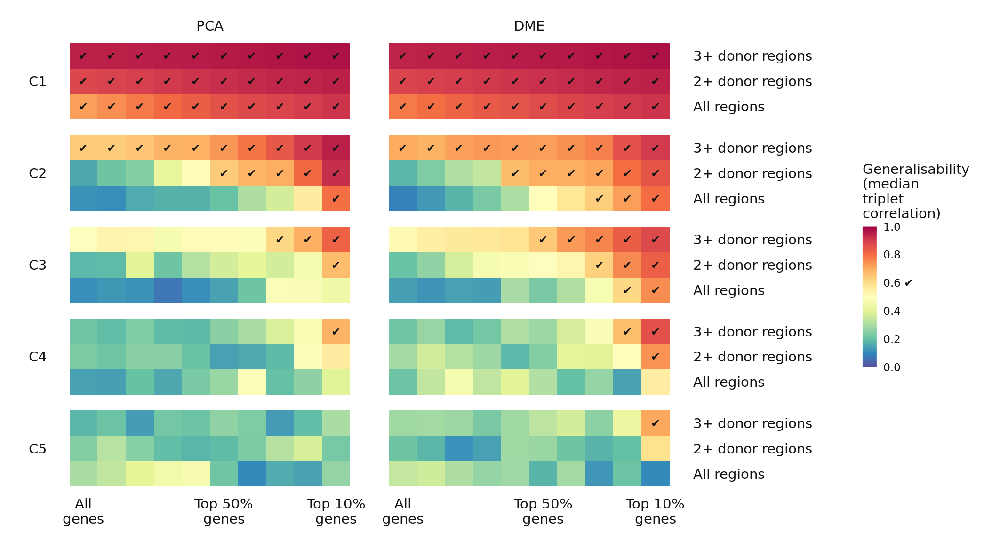

In [289]:
%%R -w 180 -h 100 -u mm -r 300 -i triplets_raster
source("../code/fig_extended.R")
triplets_raster = plot_triplets_raster(triplets_raster, n_components=5)
triplets_raster

### Version scatter plots

In [292]:
get_expression_abagen(fetch_hcp(), donors_threshold=3, gene_stability_threshold=0.7, save_name='hcp_3d_ds7')

INFO: Donor-specific atlases provided; using native coords for tissue samples
INFO: Reannotating probes with information from Arnatkevic̆iūtė et al., 2019, NeuroImage
INFO: Filtering probes with intensity-based threshold of 0.5
INFO: 32669 probes survive intensity-based filtering
INFO: Reducing probes indexing same gene with method: diff_stability
INFO: 15946 genes remain after probe filtering + selection
INFO: 458 / 477 samples matched to regions for donor #9861
INFO: 346 / 367 samples matched to regions for donor #10021
INFO: 173 / 181 samples matched to regions for donor #12876
INFO: 259 / 263 samples matched to regions for donor #14380
INFO: 222 / 224 samples matched to regions for donor #15496
INFO: 231 / 240 samples matched to regions for donor #15697
INFO: Aggregating samples to regions with provided region_agg: donors


137 / 180 regions remain after filtering for regions with samples from >= 3 donors
4784 / 15946 genes remain after filtering for top 0.3 stability
Expression matrix saved to ../data/abagen-data/expression/hcp_3d_ds7.csv


gene_symbol,A1BG,AAAS,AAED1,AAK1,AARD,AARS,ABCA1,ABCA5,ABCA6,ABCA9,...,ZSCAN29,ZSCAN31,ZSCAN5A,ZSCAN9,ZSWIM4,ZSWIM9,ZWINT,ZYX,ZZEF1,ZZZ3
label,,,,,,,,,,,,,,,,,,,,,
1,0.234124,0.686152,0.279157,0.670004,0.694569,0.500742,0.455827,0.847949,0.806617,0.819410,...,0.627291,0.784252,0.220417,0.817429,0.793574,0.183059,0.387873,0.839740,0.825577,0.346719
4,0.363618,0.681523,0.376047,0.713097,0.611765,0.558431,0.451900,0.728520,0.759100,0.654380,...,0.640444,0.756393,0.321787,0.762999,0.703900,0.207638,0.432438,0.810666,0.738654,0.357823
5,0.219162,0.648171,0.253024,0.693113,0.590371,0.509893,0.390014,0.783309,0.747686,0.812496,...,0.713580,0.685411,0.184382,0.672967,0.815209,0.366467,0.331184,0.784044,0.761205,0.309604
6,0.418642,0.633253,0.344356,0.626012,0.669849,0.472977,0.479307,0.651651,0.725277,0.644479,...,0.544879,0.608851,0.326790,0.637188,0.590776,0.469356,0.476248,0.684917,0.768377,0.443219
8,0.312791,0.619065,0.434047,0.630902,0.546099,0.648789,0.467131,0.474087,0.610623,0.575041,...,0.503053,0.422620,0.658484,0.494481,0.566637,0.380324,0.405083,0.716991,0.631567,0.326405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,0.490537,0.409748,0.423437,0.589994,0.586216,0.627218,0.377613,0.613840,0.426601,0.628341,...,0.447971,0.583386,0.511735,0.505436,0.536468,0.571593,0.502891,0.541865,0.565517,0.382571
176,0.690689,0.441887,0.515177,0.424057,0.490759,0.426175,0.584841,0.391758,0.477317,0.368153,...,0.454877,0.451370,0.542929,0.375665,0.410888,0.664362,0.554143,0.337370,0.439675,0.572576
177,0.691370,0.493273,0.504368,0.344129,0.450580,0.601366,0.534432,0.307827,0.346702,0.337571,...,0.462090,0.526276,0.583738,0.340832,0.497315,0.546639,0.561580,0.472524,0.369499,0.538924


In [293]:
pca_3d_ds7 = gradientVersion(approach='pca').fit('hcp_3d_ds7')

New gradients version: method=pca, kernel=None, sparsity=0, data=hcp_3d_ds7


In [352]:
versions_scores = pd.concat({
   'PCA, all genes,\nall regions' : pca_base.clean_scores(),
   'PCA, top 30% genes,\n3+ donor regions' : pca_3d_ds7.clean_scores(),
   'dme_3d_ds5' : dme_3d_ds5.clean_scores(),
}).reset_index(level=0).rename({'level_0':'version'},axis=1)

scores_melt = (versions_scores
               .set_index(['version', 'label'])
               .melt(ignore_index=False, var_name='C', value_name='score')
               .reset_index('version')
)
df_versions_scatter = (scores_melt.join(scores_melt, lsuffix='_x', rsuffix='_y')
    .loc[lambda x: 
            (x['version_x'].str.contains('PCA, all')) & (x['version_y'].str.contains('dme_3d_ds5')) |
            (x['version_x'].str.contains('PCA, top')) & (x['version_y'].str.contains('dme_3d_ds5'))
    ]
)
df_versions_scatter.head()

,version_x,C_x,score_x,version_y,C_y,score_y
label,,,,,,
1,"PCA, all genes,\nall regions",C1,1.246929,dme_3d_ds5,C1,1.459762
1,"PCA, all genes,\nall regions",C1,1.246929,dme_3d_ds5,C2,0.540152
1,"PCA, all genes,\nall regions",C1,1.246929,dme_3d_ds5,C3,-0.947282
1,"PCA, top 30% genes,\n3+ donor regions",C1,1.512174,dme_3d_ds5,C1,1.459762
1,"PCA, top 30% genes,\n3+ donor regions",C1,1.512174,dme_3d_ds5,C2,0.540152


`summarise()` has grouped output by 'version_x', 'C_x'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'version_x', 'C_x'. You can override using
the `.groups` argument.
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


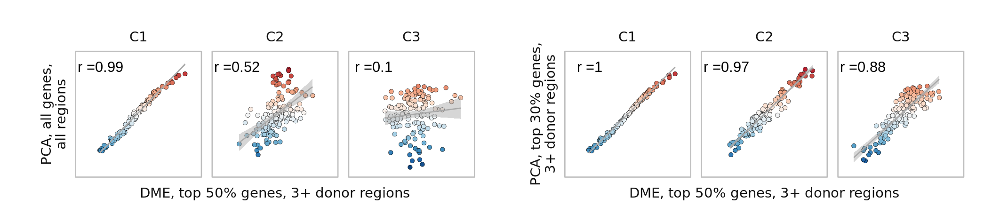

In [362]:
%%R -w 180 -h 40 -u mm -r 300 -i df_versions_scatter
source("../code/fig_extended.R")
all <- df_versions_scatter %>% filter(version_x %>% str_detect('all')) %>% plot_versions_scatter()
filter <- df_versions_scatter %>% filter(version_x %>% str_detect('top')) %>% plot_versions_scatter()
versions_scatter <- all | filter
versions_scatter

## Fig

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


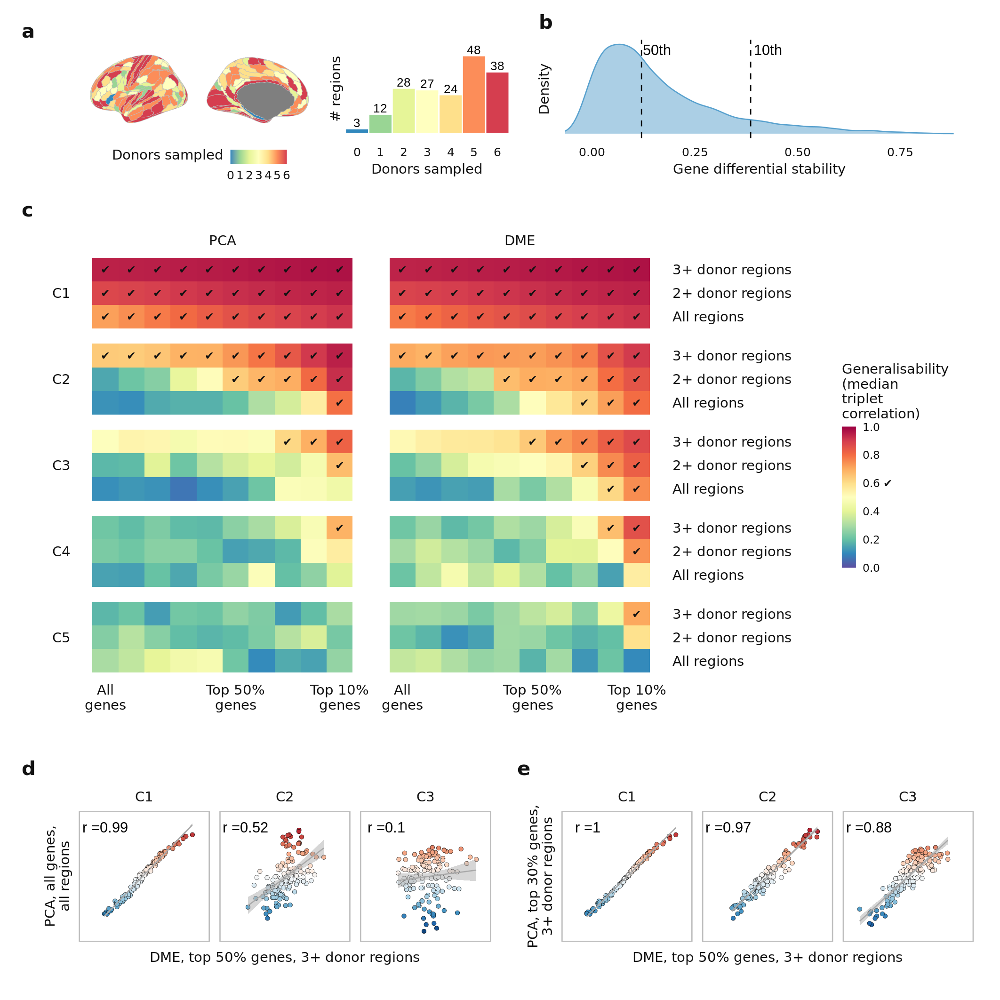

In [363]:
%%R -i donor_counts -i stability -w 180 -h 180 -u mm -r 300
source("../code/fig_extended.R")

design <- c(
    area(t=1,b=25,l=1,r=80),
    area(t=1,b=25,l=81,r=140),
    area(t=1,b=25,l=141,r=180),
    area(t=26,b=140,l=1,r=179),
    area(t=141,b=180,l=1,r=180)
)

plot <- plot_distributions + triplets_raster + versions_scatter + plot_layout(design=design)
plot + plot_annotation(tag_level='a')

### Parameter choices

In [365]:
dme_3d = gradientVersion().fit('hcp_3d')

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=hcp_3d


In [367]:
dme_3d.corr_scores(dme_3d_ds5, match=True)

,match,corr,var_expl
0,"(0, 0)",0.998123,0.018868
1,"(1, 1)",0.965403,0.007086
2,"(3, 2)",0.759789,0.005455
3,"(2, 3)",-0.674068,0.004377
4,"(4, 4)",0.841173,0.003443


In [ ]:
base = get_expression_abagen(fetch_hcp())

In [1348]:
# Define variations of processing parameters to test
variations = {
    'gene_stability_threshold': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
    'donors_threshold': [3,2,1],
    'lr_mirror': [None],
    'ibf_threshold': [0.0, 0.2, 0.5, 0.8],
    'tolerance': [0,4],
    'sim_threshold': [2],
    'agg_metric': ['median'],
    'sample_norm': [None, 'center', 'zscore', 'rs'],
    'gene_norm': [None, 'center', 'zscore', 'rs'],
    'probe_selection': ['max_intensity', 'mean', 'rnaseq']
}
defaults = {
    'gene_stability_threshold': 0.5,
    'donors_threshold': 3,
    'lr_mirror': 'rightleft',
    'ibf_threshold': 0.5,
    'tolerance': 2,
    'probe_selection': 'diff_stability',
    'sim_threshold': None,
    'agg_metric': 'mean',
    'sample_norm': 'srs',
    'gene_norm': 'srs'
}

# Reset if desired
robustness_data = {}
# robustness_data = robustness_data_3d_ds5

# Process data with one parameter varied, and save
for parameter, values in variations.items():
    print(f'--- Processing values of {parameter} ---')
    robustness_data[parameter] = {}
    for v in values:
        # Reset kwargs to default values
        kwargs = defaults.copy()
        # Update one value
        kwargs[parameter]=v
        exp = get_expression_abagen(fetch_hcp(), **kwargs)
        robustness_data[parameter][v] = exp
        print(f'Done {parameter}={v}')

# For each parameter, insert the default data as base
for parameter, default_value in defaults.items():
    robustness_data[parameter][default_value] = base

--- Processing values of sample_norm ---
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=None
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=center
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=zscore
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=rs
--- Processing values of gene_norm ---
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=None
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=center
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=zscore
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=rs


In [1349]:
# save_pickle(robustness_data, 'robustness_data_base')
# save_pickle(robustness_data, 'robustness_data_3d_ds8')
# save_pickle(robustness_data, 'robustness_data_3d_ds5')
# save_pickle(robustness_data, 'robustness_data_ds8')
robustness_data_base = load_pickle('robustness_data_base')
# robustness_data_3d_ds8 = load_pickle('robustness_data_3d_ds8')
robustness_data_3d_ds5 = load_pickle('robustness_data_3d_ds5')
# robustness_data_ds8 = load_pickle('robustness_data_ds8')

In [1350]:
def get_robustness_corrs(base_model, robustness_data=robustness_data, approach='pca', test_dme_robustness=False):
    robustness_corrs = {}
    for parameter, values in robustness_data.items():
        robustness_corrs[parameter] = {}
        for value, data in values.items():
            name_to_print = f'{parameter}:{value}'
            model = gradientVersion(approach=approach).fit(data, name=name_to_print)
            # corrs = model.corr_scores(base_model, match=True)['corr']
            corrs = pd.Series(np.diag(model.corr_scores(base_model, match=False)))
            robustness_corrs[parameter][value] = np.abs(corrs)
    
    # test base model against variations of DME parameters
    if test_dme_robustness:
        robustness_corrs['alpha'] = {}
        for alpha in [0,0.5]:
            name_to_print = f'alpha:{alpha}'
            data = base_model.expression
            model = gradientVersion(approach=approach, alpha=alpha).fit(data, name=name_to_print)
            corrs = pd.Series(np.diag(model.corr_scores(base_model, match=False)))
            robustness_corrs['alpha'][alpha] = np.abs(corrs)

        robustness_corrs['kernel'] = {}
        for kernel in ['gaussian', 'cosine', 'pearson']:
            name_to_print = f'kernel:{kernel}'
            data = base_model.expression
            model = gradientVersion(approach=approach, kernel=kernel).fit(data, name=name_to_print)
            corrs = pd.Series(np.diag(model.corr_scores(base_model, match=False)))
            robustness_corrs['kernel'][kernel] = np.abs(corrs)
            
    return robustness_corrs

In [1332]:
# get_expression_abagen(atlas=fetch_hcp(), gene_stability_threshold=0.8, save_name='hcp_ds8')
dm_hcp_ds8 = gradientVersion().fit('hcp_ds8')

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=hcp_ds8


In [1324]:
pca_hcp_base = gradientVersion(approach='pca').fit(get_expression_abagen(atlas=fetch_hcp()))

New gradients version: method=pca, kernel=None, sparsity=0, data=


In [1351]:
robustness_corrs = {
    # 'pca_hcp_base': get_robustness_corrs(pca_hcp_base, robustness_data_base, approach='pca'),
    'pca_hcp_3d_ds8': get_robustness_corrs(pca_hcp_3d_ds8, robustness_data_3d_ds8, approach='pca'),
    'dm_hcp_3d_ds5': get_robustness_corrs(dm_hcp_3d_ds5, robustness_data_3d_ds5, approach='dm', test_dme_robustness=True),
    'dm_hcp_ds8': get_robustness_corrs(dm_hcp_ds8, robustness_data_ds8, approach='dm', test_dme_robustness=True)
}

New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.0
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.1
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.2
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.3
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.4
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.5
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.6
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.7
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.8
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.9
New gradients version: method=pca, kernel=None, sparsity=0, 

In [1352]:
robustness = {}
for version_name, version_corrs in robustness_corrs.items():
    version_dict = {param:pd.concat(value_corrs) for param, value_corrs in version_corrs.items()}
    robustness[version_name] = pd.concat(version_dict)
robustness = (pd.concat(robustness)
  .reset_index()
  .set_axis(['version','parameter', 'value', 'G', 'corr'], axis=1)
  .assign(value = lambda x: x['value'].astype('str'))
)
robustness

,version,parameter,value,G,corr
0,pca_hcp_3d_ds8,gene_stability_threshold,0.0,0,0.995165
1,pca_hcp_3d_ds8,gene_stability_threshold,0.0,1,0.847612
2,pca_hcp_3d_ds8,gene_stability_threshold,0.0,2,0.197083
3,pca_hcp_3d_ds8,gene_stability_threshold,0.0,3,0.082761
4,pca_hcp_3d_ds8,gene_stability_threshold,0.0,4,0.182883
...,...,...,...,...,...
540,dm_hcp_ds8,kernel,pearson,0,0.941311
541,dm_hcp_ds8,kernel,pearson,1,0.877053
542,dm_hcp_ds8,kernel,pearson,2,0.795657
543,dm_hcp_ds8,kernel,pearson,3,0.679419


In [1959]:
# Remove identity rows
# drops = [
#   ('pca_hcp_3d_ds8','gene_stability_threshold',0.8),
#   ('dm_hcp_3d_ds5','gene_stability_threshold',0.5),
#   ('dm_hcp_ds8','gene_stability_threshold',0.8),
#   ('pca_hcp_3d_ds8','donors_threshold',3),
#   ('dm_hcp_3d_ds5','donors_threshold',3),
#   ('dm_hcp_ds8','donors_threshold',1)
# ]

robustness = {}
for version_name, version_corrs in robustness_corrs.items():
    version_dict = {param:pd.concat(value_corrs) for param, value_corrs in version_corrs.items()}
    robustness[version_name] = pd.concat(version_dict)
robustness = (pd.concat(robustness)
  # .drop(index=drops)
  .reset_index()
  .set_axis(['version','parameter', 'value', 'G', 'corr'], axis=1)
  .assign(value = lambda x: x['value'].astype('str'))
)
# robustness



# Replace names of some value parameters for plot
robustness['value'] = robustness['value'].replace({'nan':'none',})
robustness.loc[lambda x: x['parameter']=='gene_stability_threshold', 'value'] = \
  robustness.loc[lambda x: x['parameter']=='gene_stability_threshold', 'value'] \
  .apply(lambda ds: f'top {100-round(float(ds)*100)}%').replace({'top 100%':'all genes'})

robustness.loc[lambda x: x['parameter']=='donors_threshold', 'value'] = \
  robustness.loc[lambda x: x['parameter']=='donors_threshold', 'value'] \
  .replace({'1':'all regions', '2': '2+ donors', '3': '3+ donors'})

# Replace parameter names for plot
parameter_names = {
    'gene_stability_threshold': 'Differential stability\ngene filter',
    'donors_threshold': 'Donors/region filter',
    'lr_mirror': 'Right hemi samples\nDefault: mirror',
    'ibf_threshold': 'Gene intensity filter\nDefault: 0.5',
    'sim_threshold': 'Probe similarity threshold\nDefault: none',
    'probe_selection': 'Probe-to-gene selection\nDefault: differential stability',
    'tolerance': 'Sample-to-region \nmatching tolerance\nDefault: 2',
    'agg_metric': 'Sample-to-region aggregation\nDefault: mean',
    'sample_norm': 'Sample normalization\nDefault: scaled robust sigmoid',
    'gene_norm': 'Gene normalization\nDefault: scaled robust sigmoid',
    'kernel': 'DME kernel parameter\nDefault: normalized cosine',
    'alpha': 'DME alpha parameter\nDefault: 1',
}
robustness['parameter'] = pd.Categorical(robustness['parameter'].map(parameter_names),
                          categories=parameter_names.values(), ordered=True)

# Replace version names for plot
version_names = {
    'pca_hcp_base': 'PCA, all genes,\nall regions',
    'pca_hcp_3d_ds8': 'PCA, 20% genes,\n3+ donor regions',
    'dm_hcp_3d_ds5': 'DME, 50% genes,\n3+ donor regions',
    'dm_hcp_ds8': 'DME, 20% genes,\nall regions'
}
robustness['version'] = robustness['version'].map(version_names)
robustness['value'] = pd.Categorical(robustness['value'], 
                      categories=robustness['value'].unique(), ordered=True)
robustness = robustness.sort_values(['parameter', 'value'])

# Identify self rows
robustness['self'] = False
robustness.loc[lambda x: (x['version'].str.contains('PCA')) & 
                         (x['parameter'].str.contains('gene filter')) & 
                         (x['value'].str.contains('top 20%')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 50%')) & 
                         (x['parameter'].str.contains('gene filter')) & 
                         (x['value'].str.contains('top 50%')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 20%')) & 
                         (x['parameter'].str.contains('gene filter')) & 
                         (x['value'].str.contains('top 20%')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('PCA')) & 
                         (x['parameter'].str.contains('Donors/region')) & 
                         (x['value'].str.contains('3+')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 50%')) & 
                         (x['parameter'].str.contains('Donors/region')) & 
                         (x['value'].str.contains('3+')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 20%')) & 
                         (x['parameter'].str.contains('Donors/region')) & 
                         (x['value'].str.contains('all regions')),
               'self'] = True

robustness

,version,parameter,value,G,corr,self
0,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,0,0.995165,False
1,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,1,0.847612,False
2,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,2,0.197083,False
3,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,3,0.082761,False
4,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,4,0.182883,False
...,...,...,...,...,...,...
525,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,0,0.999997,False
526,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,1,0.999745,False
527,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,2,0.999742,False
528,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,3,0.999921,False


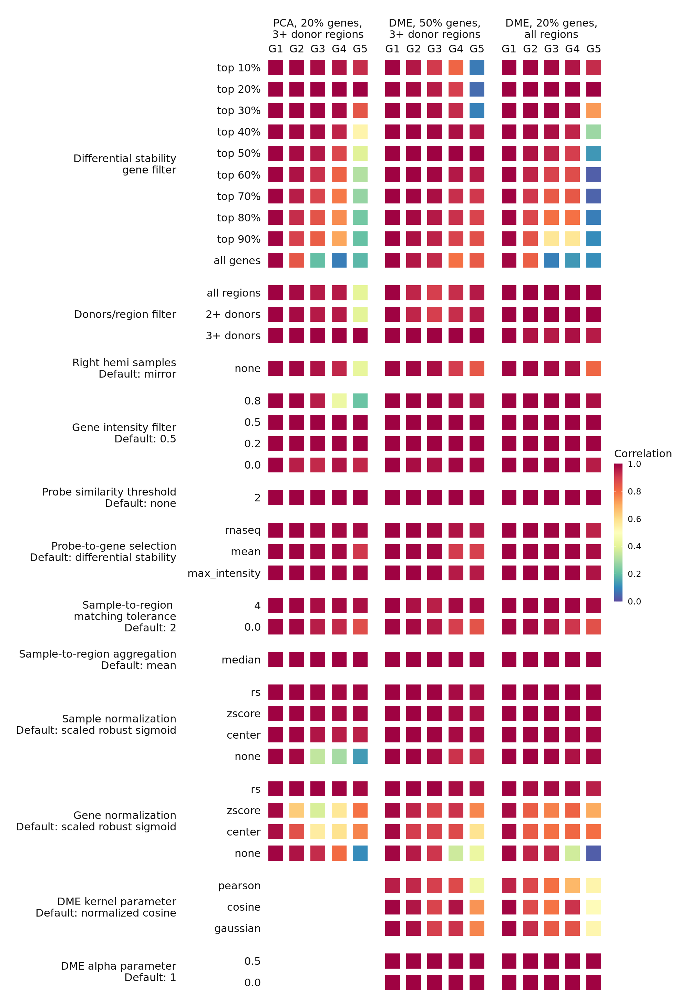

In [1960]:
%%R -w 20 -h 29 -r 100 --units in -i robustness
# robustness %>% filter(grepl('Gene', parameter))
robustness <- robustness %>%
mutate(version = factor(version, ordered=T, levels=unique(.$version))) %>%
mutate(parameter = factor(parameter, ordered=T, levels=unique(.$parameter))) %>%
mutate(value = factor(value, ordered=T, levels=unique(.$value))) %>%
mutate(G = factor(G, levels=c(0,1,2,3,4), labels=c('G1','G2','G3','G4','G5')))

robustness %>% 
ggplot(aes(x=G, y=value, fill=corr)) + 
facet_grid(parameter~version, scales='free_y', space='free', switch='y') + #, scales='free_x', switch='x') + 
geom_tile(aes(alpha=self), width=.7, height=.7) + #, color='grey50', size=.5) +
# geom_text(aes(label='★'), data=robustness %>% filter(corr>0.6), color='gray30', size=5) +
scale_alpha_manual(values=c(1,1), guide='none') +
scale_fill_gradientn(
        colors=rev(brewer.spectral(100)),
      #   colors=cubicl(100),
        limits=c(0,1.001), breaks=seq(0,1,.2),
        labels=c('0.0', '0.2', '0.4', '0.6', '0.8', '1.0'),
        name='Correlation'
) +
coord_cartesian(clip='off') +
scale_x_discrete(position='top') +
# guides(fill=guide_colorbar(barwidth=20)) +
guides(fill=guide_colorbar(barheight=20)) +
ylab('') + xlab('') +
theme_minimal() +
theme(text=element_text(size=22, family='Calibri', color='grey7'),
      axis.text=element_text(size=22, family='Calibri', color='grey7'),
      panel.grid=element_blank(),
      panel.spacing=unit(1,'lines'),
      legend.position='right',
      # legend.title=element_text(vjust=1),
      # axis.text.x=element_text(),
      strip.placement='outside',
      strip.text.x=element_text(size=22, family='Calibri', color='grey7'),
      strip.text.y.left=element_text(size=22, family='Calibri', color='grey7', 
                  angle=0, hjust=1, margin=margin(r=20)),
      plot.margin=margin(l=10,r=30,t=10,b=10)
)

### Parcellation

In [19]:
get_expression_abagen(fetch_dk(), donors_threshold=3, gene_stability_threshold=0.5, save_name='dk_3d_ds5')
get_expression_abagen(fetch_dx(), donors_threshold=3, gene_stability_threshold=0.5, save_name='dx_3d_ds5')
get_expression_abagen(fetch_schaefer(size=400), donors_threshold=3, gene_stability_threshold=0.5, save_name='s400_3d_ds5')

INFO: Donor-specific atlases provided; using native coords for tissue samples
INFO: Reannotating probes with information from Arnatkevic̆iūtė et al., 2019, NeuroImage
INFO: Filtering probes with intensity-based threshold of 0.5
INFO: 32669 probes survive intensity-based filtering
INFO: Reducing probes indexing same gene with method: diff_stability
INFO: 15946 genes remain after probe filtering + selection
INFO: 460 / 477 samples matched to regions for donor #9861
INFO: 346 / 367 samples matched to regions for donor #10021
INFO: 179 / 181 samples matched to regions for donor #12876
INFO: 261 / 263 samples matched to regions for donor #14380
INFO: 223 / 224 samples matched to regions for donor #15496
INFO: 235 / 240 samples matched to regions for donor #15697
INFO: Aggregating samples to regions with provided region_agg: donors


33 / 69 regions remain after filtering for regions with samples from >= 3 donors
7973 / 15946 genes remain after filtering for top 0.5 stability
Expression matrix saved to ../data/abagen-data/expression/dk_3d_ds5.csv


gene_symbol,A1BG,A1BG-AS1,AAAS,AAED1,AAGAB,AAK1,AARD,AARS,AARS2,AASDH,...,ZSCAN5A,ZSCAN9,ZSWIM4,ZSWIM5,ZSWIM7,ZSWIM9,ZWINT,ZYX,ZZEF1,ZZZ3
label,,,,,,,,,,,,,,,,,,,,,
1,0.466261,0.584029,0.532379,0.477652,0.588122,0.490802,0.525323,0.571136,0.484496,0.557415,...,0.465917,0.522364,0.471382,0.562140,0.444867,0.530216,0.551194,0.589163,0.593991,0.468364
2,0.621202,0.495002,0.372546,0.652848,0.524384,0.397289,0.303704,0.304530,0.466782,0.495198,...,0.606767,0.291163,0.339044,0.459678,0.605962,0.691170,0.429493,0.237261,0.438173,0.561075
3,0.531708,0.448258,0.479379,0.490855,0.658107,0.579577,0.474935,0.610781,0.397371,0.420598,...,0.600494,0.479751,0.551378,0.408028,0.589141,0.488998,0.396240,0.599561,0.389518,0.496475
4,0.327959,0.274514,0.702984,0.332070,0.373369,0.788593,0.611054,0.575979,0.485089,0.718833,...,0.237967,0.789104,0.716972,0.681156,0.235995,0.196576,0.371541,0.846857,0.724428,0.331240
5,0.708189,0.324361,0.292653,0.644531,0.355793,0.278237,0.267202,0.172071,0.746889,0.625831,...,0.761889,0.332742,0.255255,0.446425,0.623223,0.739295,0.764663,0.093821,0.445011,0.641067
6,0.618361,0.608191,0.430968,0.520043,0.466223,0.476536,0.442333,0.457194,0.539648,0.515099,...,0.528516,0.420035,0.398916,0.495390,0.440082,0.513879,0.563060,0.418461,0.488707,0.543004
7,0.384924,0.432079,0.527688,0.418484,0.552430,0.624589,0.552422,0.540947,0.528335,0.543837,...,0.419991,0.570533,0.572632,0.492285,0.464868,0.537906,0.412843,0.606423,0.556172,0.430986
8,0.607224,0.599900,0.413810,0.516601,0.535731,0.445620,0.509202,0.426519,0.490206,0.523065,...,0.488372,0.377632,0.428756,0.463032,0.488550,0.589455,0.576092,0.390367,0.469477,0.538484
9,0.386225,0.411034,0.545713,0.460907,0.425466,0.621594,0.709250,0.425392,0.647932,0.674932,...,0.391797,0.521210,0.577503,0.545560,0.439981,0.606150,0.315061,0.460450,0.693338,0.444873


In [20]:
dme_dk_3d_ds5 = gradientVersion(approach='dm').fit('dk_3d_ds5')
dme_dx_3d_ds5 = gradientVersion(approach='dm').fit('dx_3d_ds5')
dme_s400_3d_ds5 = gradientVersion(approach='dm').fit('s400_3d_ds5')

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=dk_3d_ds5
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=dx_3d_ds5
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=s400_3d_ds5


In [71]:
hcp_scores = dme_3d_ds5.clean_scores()
dk_scores  = dme_dk_3d_ds5.clean_scores()
dx_scores  = dme_dx_3d_ds5.clean_scores()
s400_scores = (dme_s400_3d_ds5.scores
               .iloc[:,:3].set_axis(['C1','C2','C3'],axis=1)
               .apply(lambda x: (x-np.mean(x))/np.std(x))
               .join(get_labels_schaefer(size=400).drop_duplicates())
            )

In [136]:
corrs_dict = {
    'HCP-MMP': correlate(dme_3d_ds5.weights, dme_3d_ds5.weights),
    'Schaefer-400': correlate(dme_s400_3d_ds5.weights, dme_3d_ds5.weights),
    'Desterieux': correlate(dme_dx_3d_ds5.weights, dme_3d_ds5.weights),    
    'Desikan-Killiany': correlate(dme_dk_3d_ds5.weights, dme_3d_ds5.weights),
}

weight_corrs = (pd.concat(corrs_dict)
 .melt(ignore_index=False)
 .reset_index()
 .set_axis(['version','x','y','corr'], axis=1)
 .assign(comparison = 'HCP-MMP')
)

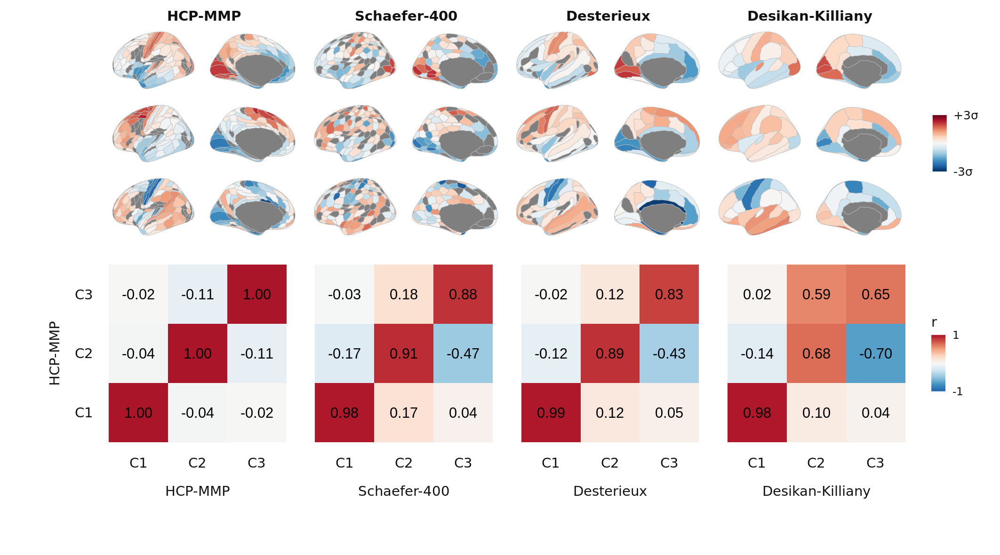

In [194]:
%%R -w 180 -h 100 -u mm -r 300 -i hcp_scores -i dk_scores -i dx_scores -i s400_scores -i weight_corrs
source("../code/fig_extended.R")

brain_hcp <- plot_brains(hcp_scores, facet='v', atlas='hcp') + ggtitle('HCP-MMP') 
brain_s400 <- plot_brains(s400_scores, facet='v', atlas='s400') + ggtitle('Schaefer-400')
brain_dx <- plot_brains(dx_scores, facet='v', atlas='dx') + ggtitle('Desterieux')
brain_dk <- plot_brains(dk_scores, facet='v', atlas='dk') + ggtitle('Desikan-Killiany')

brains <- brain_hcp + brain_s400 + brain_dx + brain_dk + plot_layout(ncol=4, guides='collect') & theme(legend.position='right')
heatmaps <- plot_weight_heatmaps(weight_corrs, spacing=3, ylab='HCP-MMP')

brains / heatmaps

### Region-region coexpression

In [ ]:
expression_dict = {
    'Region-region co-expression (original)': dme_3d_ds5.expression.apply(lambda x: (x-np.mean(x))/np.std(x)),
    'Region-region co-expression (without C1)': regress_out_axes(dme_3d_ds5, 1)
}
coexp_dict = {name:get_coexp(expression) for name, expression in expression_dict.items()}

In [ ]:
coexp_df = (pd.concat(coexp_dict)
    .melt(ignore_index=False)
    .rename_axis(['version', 'x'], axis=0)
    .set_axis(['y', 'r'], axis=1)
    .reset_index()
)

In [ ]:
# coexp_df = (
#     regress_out_axes(dme_3d_ds5, 1)
#     # ((dme_3d_ds5.expression - dme_3d_ds5.expression.mean()) / dme_3d_ds5.expression.std())
#     .pipe(get_coexp)
#     .melt(ignore_index=False)
#     .rename_axis(['x'], axis=0)
#     .set_axis(['y', 'r'], axis=1)
#     .reset_index()
# )
# # coexp_df

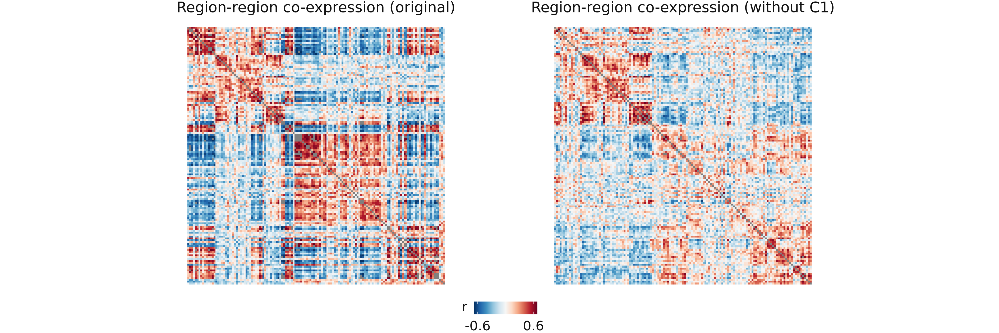

In [ ]:
%%R -i coexp_df -w 48 -h 16 --units cm -r 200
source("../code/fig1_plots.R")
plot_coexp(coexp_df)

### Hawrylycz 2012 PCs

In [452]:
hawrylycz_pcs = pd.read_csv("../data/hawrylycz2012_1000genePCs.csv")
hawrylycz_pcs_brain1 = hawrylycz_pcs.iloc[:,:11].set_index('Gene.B1').rename({'PC 1':'PC1','PC 2':'PC2','PC 3':'PC3'}, axis=1)
hawrylycz_pcs_brain2 = hawrylycz_pcs.iloc[:,11:].set_index('Gene.B2').rename({'PC 1.1':'PC1','PC 2.1':'PC2','PC 3.1':'PC3'}, axis=1)

hawrylycz_pcs = pd.concat({
    'Brain 1 genes': hawrylycz_pcs_brain1.loc[:, ['PC1','PC2','PC3']], 
    'Brain 2 genes': hawrylycz_pcs_brain2.loc[:, ['PC1','PC2','PC3']]
})
hawrylycz_pcs

PC1       PC2       PC3
Brain 1 genes FXYD6       0.983016 -0.033648 -0.018557
              TUBB2A      0.982698  0.023474  0.025298
              SUMO3       0.979685 -0.027263  0.028489
              POLR3K      0.979399  0.040162  0.025744
              MTCH1       0.978731  0.031108 -0.026919
...                            ...       ...       ...
Brain 2 genes TUBB2B      0.501143  0.035008  0.074143
              TNN         0.696344  0.074340  0.030996
              GPC5        0.938291 -0.139395 -0.191785
              THC2555234 -0.499592  0.456087 -0.455869
              TLR4        0.875941 -0.033911 -0.001080

[2000 rows x 3 columns]

In [453]:
hawrylycz_pcs_corr = (weights
                      .join(hawrylycz_pcs.reset_index(0).rename({'level_0':'brain'}, axis=1))
                      .dropna()
                      .groupby('brain')
                      .apply(lambda x: x.corr().iloc[:3,3:])
)
hawrylycz_pcs_corr

PC1       PC2       PC3
brain                                         
Brain 1 genes C1 -0.829683  0.513810  0.023885
              C2  0.349013  0.523050 -0.631157
              C3  0.445947  0.347316  0.398983
Brain 2 genes C1 -0.855508 -0.127846 -0.015258
              C2 -0.221765 -0.344516  0.758794
              C3  0.114237 -0.476433 -0.302873

In [461]:
donor1 = '9861'
donor2 = '10021'

# donor1_expression = get_expression_abagen(fetch_hcp(), save_name='base_donor1', donors=donor1, probe_selection='max_intensity')
# donor2_expression = get_expression_abagen(fetch_hcp(), save_name='base_donor2', donors=donor2, probe_selection='max_intensity')
donor1_expression = pd.read_csv("../data/abagen-data/expression/base_donor1.csv", index_col=0)
donor2_expression = pd.read_csv("../data/abagen-data/expression/base_donor2.csv", index_col=0)

donor1_expression = donor1_expression.dropna(how='all', axis=0).dropna(how='all', axis=1)
donor2_expression = donor2_expression.dropna(how='all', axis=0).dropna(how='all', axis=1)

In [463]:
def compute_PCs_and_correlate_weights(expression, genes, weights=weights):
    return (expression.loc[:,lambda x: np.intersect1d(x.columns, genes)]
    .pipe(lambda x: pd.DataFrame(PCA(n_components=3).fit(x).components_.T, index=x.columns))
    .set_axis(['PC1','PC2','PC3'], axis=1)
    .join(weights)
    .corr().iloc[3:,:3]
    )

hawrylycz_genes_single_brain_pca_corr = pd.concat({
    'Brain 1 genes': compute_PCs_and_correlate_weights(donor1_expression, hawrylycz_pcs_brain1.index),
    'Brain 2 genes': compute_PCs_and_correlate_weights(donor2_expression, hawrylycz_pcs_brain2.index)
})

all_genes_single_brain_pca_corr = pd.concat({
    'Brain 1 genes': compute_PCs_and_correlate_weights(donor1_expression, donor1_expression.columns),
    'Brain 2 genes': compute_PCs_and_correlate_weights(donor2_expression, donor1_expression.columns)
})

hawrylycz_genes_base_pca_corr = pd.concat({
    'Brain 1 genes': compute_PCs_and_correlate_weights(pca_base.expression, hawrylycz_pcs_brain1.index),
    'Brain 2 genes': compute_PCs_and_correlate_weights(pca_base.expression, hawrylycz_pcs_brain2.index)
})

hawrylycz_genes_3d_ds5_pca_corr = pd.concat({
    'Brain 1 genes': compute_PCs_and_correlate_weights(dme_3d_ds5.expression, hawrylycz_pcs_brain1.index),
    'Brain 2 genes': compute_PCs_and_correlate_weights(dme_3d_ds5.expression, hawrylycz_pcs_brain2.index)
})
all_genes_single_brain_pca_corr

PC1       PC2       PC3
Brain 1 genes C1 -0.545156  0.335986  0.652716
              C2  0.284505 -0.227369  0.030652
              C3  0.126334 -0.110316  0.147463
Brain 2 genes C1 -0.040827 -0.777423 -0.367918
              C2 -0.092099 -0.039237 -0.012819
              C3  0.199499 -0.148870  0.589550

In [427]:
# compute_PCs_and_correlate_weights(donor1_expression, hawrylycz_pcs_brain1.index, weights=hawrylycz_pcs_brain1.loc[:,['PC1','PC2','PC3']])
# compute_PCs_and_correlate_weights(donor2_expression, hawrylycz_pcs_brain2.index, weights=hawrylycz_pcs_brain2.loc[:,['PC1','PC2','PC3']])

,PC1,PC2,PC3
G1,-0.851855,-0.045635,0.178829
G2,-0.141275,-0.109012,0.283583
G3,0.002883,-0.638594,-0.526596


In [466]:
df_hawrylycz_corr = (pd.concat({
    'PCs from Hawrylycz 2012:\n1000 most-variable genes\nfrom single-brain data\nin 56-gyri parcellation': hawrylycz_pcs_corr,
    'Same 1000 most-variable genes,\nPCs from single-brain data\nin HCP-MMP parcellation': hawrylycz_genes_single_brain_pca_corr,
    'Same 1000 most-variable genes,\nPCs from unfiltered 6-brain data\nin HCP-MMP parcellation': hawrylycz_genes_base_pca_corr,
    'Same 1000 most-variable genes,\nPCs from filtered 6-brain data\nin HCP-MMP parcellation': hawrylycz_genes_3d_ds5_pca_corr
}).melt(ignore_index=False, var_name='PC', value_name='r')
.reset_index().rename({'level_0':'data', 'level_2':'C'}, axis=1)
)

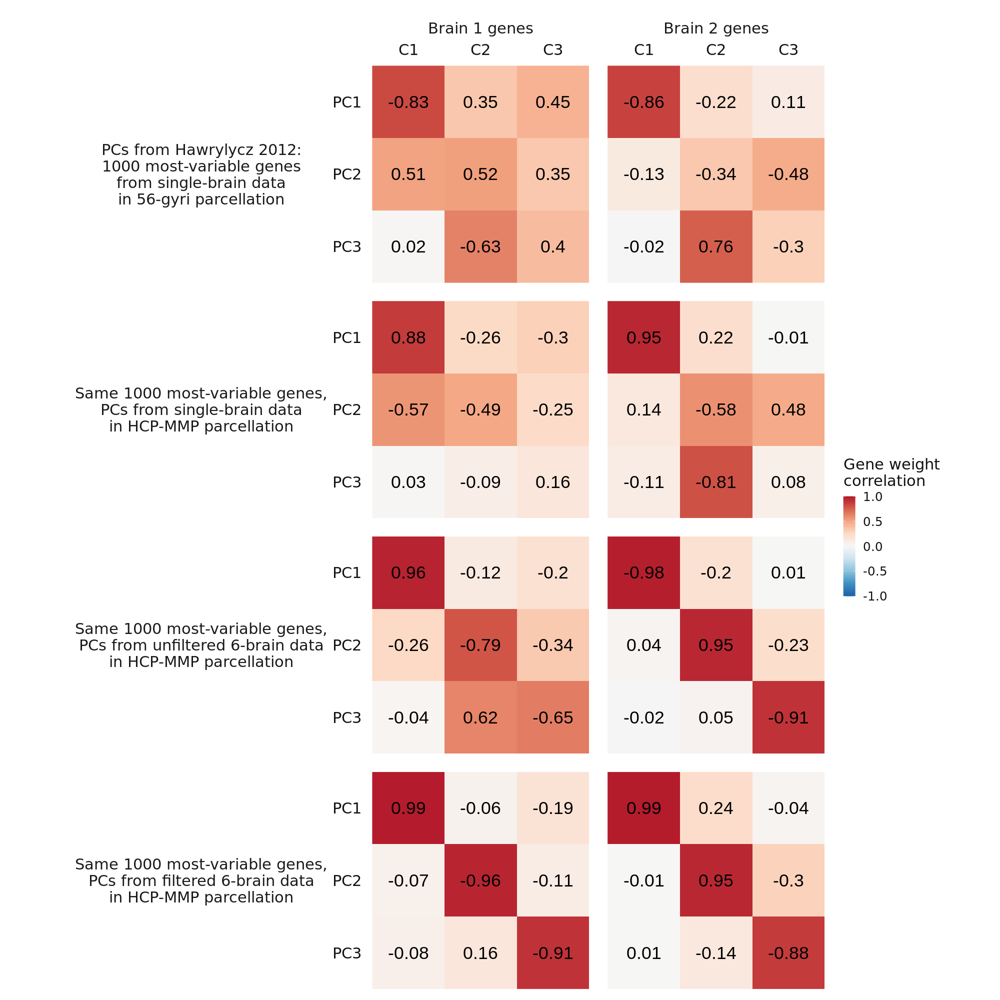

In [468]:
%%R -i df_hawrylycz_corr -w 20 -h 20 -u in -r 100
df_hawrylycz_corr %>% 
mutate(data=factor(data, ordered=T, levels=unique(.$data))) %>% 
ggplot(aes(x=C, y=PC)) + 
facet_grid(data~brain, switch='y') +
geom_raster(aes(fill=abs(r))) +
geom_text(aes(label=round(r,2)), vjust=.5, hjust=.5, size=9, color='black') +
scale_fill_gradientn(colors=rev(brewer.rdbu(100))[10:90], limits=c(-1,1),
                     name='Gene weight\ncorrelation') +
scale_x_discrete(position='top') +
scale_y_discrete(limits=rev) +
guides(fill=guide_colorbar(barheight=10)) +
xlab('') + ylab('') +
theme_minimal() +
theme(panel.grid=element_blank(),
        text = element_text(size=22, color='grey7', family='Calibri'),
        axis.text = element_text(size=22, color='grey7', family='Calibri'),
        legend.title=element_text(vjust=1),
        legend.position='right',
        aspect.ratio=1,
        strip.placement='outside',
        strip.text.y.left = element_text(angle=0, vjust=.5, size=22),
        strip.text = element_text(angle=0, vjust=1, size=22)
        )

### Burt single gene enrichments

In [1097]:
burt_genes = ['CORT','CALB1','SST','PVALB','CCK','NPY','PNOC','CALB2','VIP']
burt_genes = pd.DataFrame({'gene':burt_genes, 'label':burt_genes})
burt_stats = compute_null_p(*compute_enrichments(weights, nulls, burt_genes))

In [ ]:
layer_genes = get_layer_genes(which='maynard', add_hse_genes=False)
layer_stats = compute_null_p(*compute_enrichments(weights, nulls, layer_genes))

In [1113]:
grin_genes = ['GRIN' + x for x in ['3A','2B','2C','2A','A','1','3B','2D']]
gabra_genes = ['GABRA' + x for x in ['3','5','2','1','4']]
grin_gabra_genes = grin_genes + gabra_genes
grin_gabra_genes = pd.DataFrame({'gene':grin_gabra_genes, 'label':grin_gabra_genes})
grin_gabra_stats = compute_null_p(*compute_enrichments(weights, nulls, grin_gabra_genes))

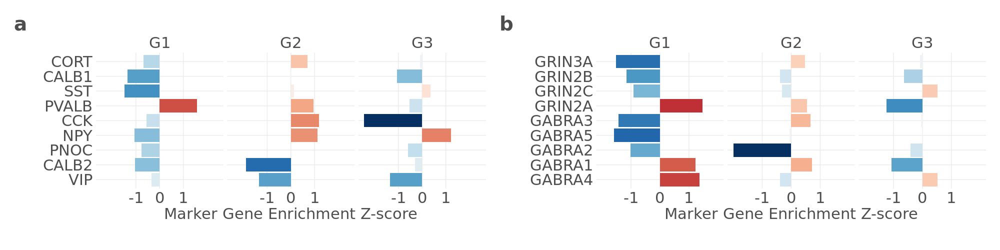

In [1128]:
%%R -i burt_stats -i grin_gabra_stats -w 20 -h 5 --units in -r 100
g1 = plot_enrichment_bars_z(burt_stats, xlab='Marker Gene Enrichment Z-score')
g2 = plot_enrichment_bars_z(grin_gabra_stats, xlab='Marker Gene Enrichment Z-score')

((g1 | g2) &theme(
  text=element_text(size=22, color='grey30', family='Calibri'), 
  axis.text=element_text(size=22, color='grey30', family='Calibri'),
  strip.text=element_text(size=22, color='grey30', family='Calibri'),
  legend.text=element_text(size=22, color='grey30', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=20, l=10, "pt"),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)) + plot_annotation(tag_level='a')

### Neuron subtype enrichments

In [1121]:
lake_subtypes = get_cell_genes(which='jakob', include='lake_plus_glia', subtype=True, combine_layers=False)
order = (lake_subtypes
         .assign(neuro = lambda x: [False if c in ['Endo', 'Oligo', 'Micro', 'OPC', 'Astro'] else True for c in x.label])
         .assign(ex_in = lambda x: [False if 'In' in c else True for c in x.label])
         .sort_values(['neuro', 'ex_in'], ascending=False).label.unique()
        )

lake_stats = compute_null_p(*compute_enrichments(weights, nulls, lake_subtypes), order=order)

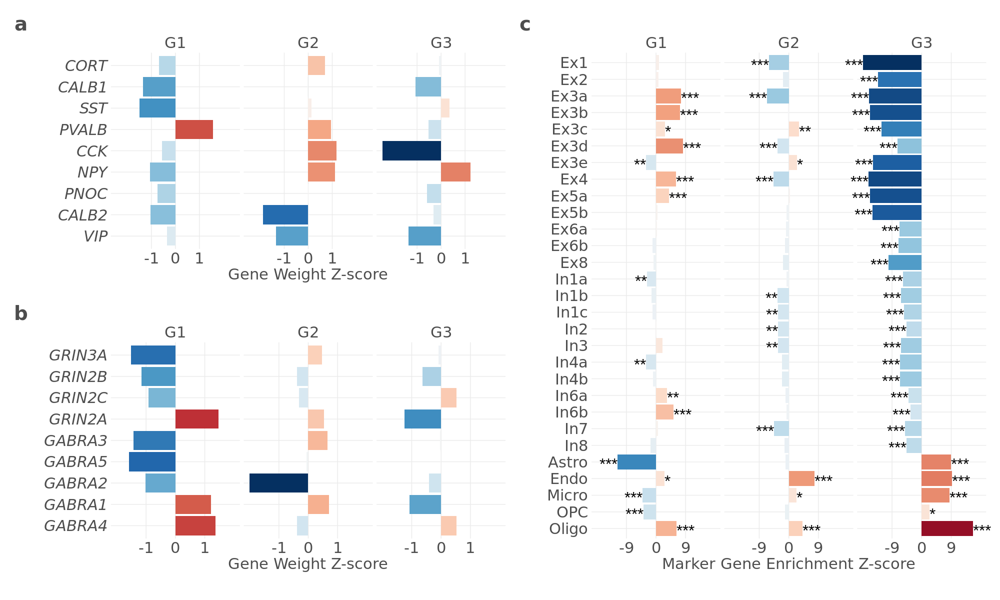

In [1134]:
%%R -i lake_stats -w 20 -h 12 --units in -r 100
g1 = plot_enrichment_bars_z(burt_stats, xlab='Gene Weight Z-score') + theme(axis.text.y=element_text(face='italic'))
g2 = plot_enrichment_bars_z(grin_gabra_stats, xlab='Gene Weight Z-score') + theme(axis.text.y=element_text(face='italic'))
g3 = plot_enrichment_bars_z(lake_stats, xlab='Marker Gene Enrichment Z-score') 

(((g1 / g2) | g3) & theme(
  text=element_text(size=22, color='grey30', family='Calibri'), 
  axis.text=element_text(size=22, color='grey30', family='Calibri'),
  strip.text=element_text(size=22, color='grey30', family='Calibri'),
  legend.text=element_text(size=22, color='grey30', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=20, l=10, "pt"),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)) + plot_annotation(tag_level='a')

### MRI PCA permutations 

In [1204]:
version = dm_hcp_3d_ds5
pca_scores, pca_var, pca_weights = maps_pca(maps_for_pca)
corrs = get_corrs(version.clean_scores(), pca_scores).abs()
matches = version.match_components(corrs, n_components=3)

var = pd.Series(pca_var, index=['MRI PC1','MRI PC2', 'MRI PC3'], name='var')

MRI_PC = [ix[0] for ix in matches[0]]
G = [ix[1] for ix in matches[0]]
pca_corrs_all = (pd.DataFrame({'G':G, 'r':matches[1], 'MRI_PC':MRI_PC})
                 .set_index('MRI_PC').join(var).reset_index()
                )
pca_corrs_all

,MRI_PC,G,r,var
0,MRI PC2,G1,0.711834,0.199709
1,MRI PC1,G2,0.591680,0.311035
2,MRI PC3,G3,0.023040,0.140943


In [2259]:
# pca_corrs_boot = {
#     'pca_corrs_boot_9' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=9, replace=False),
#     'pca_corrs_boot_8' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=8, replace=False),
#     'pca_corrs_boot_7' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=7, replace=False),
#     'pca_corrs_boot_6' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=6, replace=False),
#     'pca_corrs_boot_5' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=5, replace=False)
# }
# pca_corrs_boot = pd.concat(pca_corrs_boot)
pca_corrs_boot = maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10000, n_sample=10, replace=True)

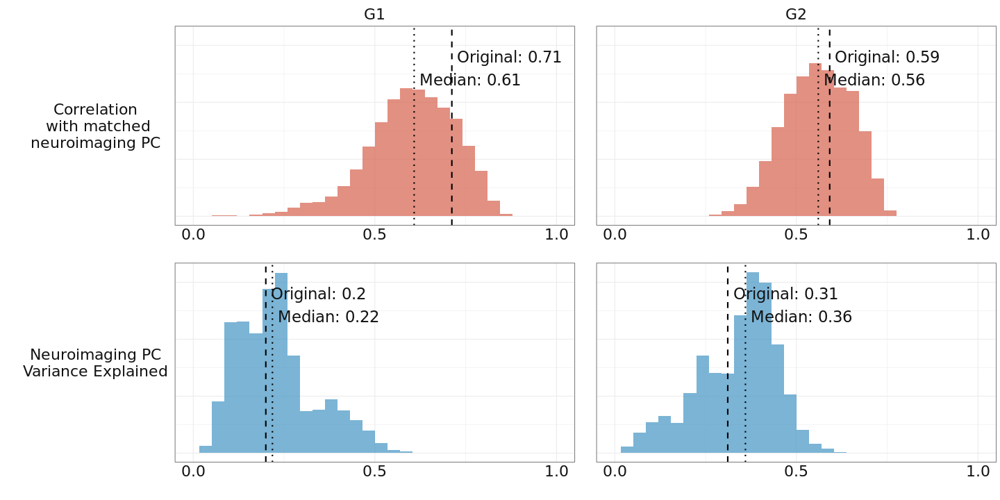

In [2266]:
%%R -i pca_corrs_all -i pca_corrs_boot -w 20 -h 10 --units in
source("../code/plot_maps.R")
plot_maps_pca_boot(pca_corrs_all %>% filter(G!='G3'), pca_corrs_boot %>% filter(G!='G3'))

### VE & Yeo

In [ ]:
hcp_scores = dm_hcp_3d_ds5.clean_scores()
null_scores = np.load('../outputs/permutations/hcp_3d_ds5_spin_5000.npy')

In [2151]:
mesulam_ve_yeo.head()

,label,Mesulam,Mesulam_colors,Mesulam_names,Yeo,Yeo_colors,Yeo_names,vonEconomo,vonEconomo_colors,vonEconomo_names,x,y,z,G1,G2,G3
1,V1,4,#80B1D3,Idiotypic,1,#660066,Visual,5,#fffb00,Sensory 1,11.210,49.816,35.575,2.118002,-2.126003,1.871407
2,MST,3,#FB8072,Unimodal,1,#660066,Visual,4,#f59505,Sensory 2,36.250,34.011,37.570,NaN,NaN,NaN
3,V6,3,#FB8072,Unimodal,1,#660066,Visual,4,#f59505,Sensory 2,10.096,35.750,55.243,NaN,NaN,NaN
4,V2,4,#80B1D3,Idiotypic,1,#660066,Visual,4,#f59505,Sensory 2,11.179,46.890,36.613,2.047980,-1.772881,1.459301
5,V3,4,#80B1D3,Idiotypic,1,#660066,Visual,4,#f59505,Sensory 2,14.580,47.879,37.700,2.032762,-1.899769,1.275806


In [2189]:
atlas_data = pd.read_csv('../data/mesulam_ve_yeo.csv', index_col=0).join(hcp_scores.set_index('label'), on='label')
atlas_stats = {}
for atlas in ['Mesulam', 'vonEconomo', 'Yeo']:
    atlas_regions = atlas_data[atlas].dropna()
    true_means, null_means = compute_region_means(hcp_scores, null_scores, atlas_regions, method='mean')
    atlas_scores_sig = compute_null_p(true_means, null_means, adjust='fdr_bh').assign(label=lambda x: x['label'].astype('string'))
    atlas_colors = (atlas_data.loc[:,[atlas, f'{atlas}_names', f'{atlas}_colors']].set_axis(['label','name','color'],axis=1)
                  .drop_duplicates().assign(label=lambda x: x['label'].astype('string')))
    atlas_stats[atlas] = atlas_scores_sig.join(atlas_colors.set_index('label'), on='label')
atlas_stats = pd.concat(atlas_stats).reset_index(0).rename({'level_0':'atlas'}, axis=1)

/home/jovyan/work/notebooks/../code/mri_maps.py:307: RuntimeWarning: Mean of empty slice
  true[region] = pd.Series(np.nanmean(scores_array[mask, :], axis=0))
/home/jovyan/work/notebooks/../code/mri_maps.py:308: RuntimeWarning: Mean of empty slice
  null[region] = pd.DataFrame(np.nanmean(null_scores[mask, :, :], axis=0)).T
/home/jovyan/work/notebooks/../code/mri_maps.py:308: RuntimeWarning: Mean of empty slice
  null[region] = pd.DataFrame(np.nanmean(null_scores[mask, :, :], axis=0)).T
/home/jovyan/work/notebooks/../code/mri_maps.py:307: RuntimeWarning: Mean of empty slice
  true[region] = pd.Series(np.nanmean(scores_array[mask, :], axis=0))
/home/jovyan/work/notebooks/../code/mri_maps.py:308: RuntimeWarning: Mean of empty slice
  null[region] = pd.DataFrame(np.nanmean(null_scores[mask, :, :], axis=0)).T


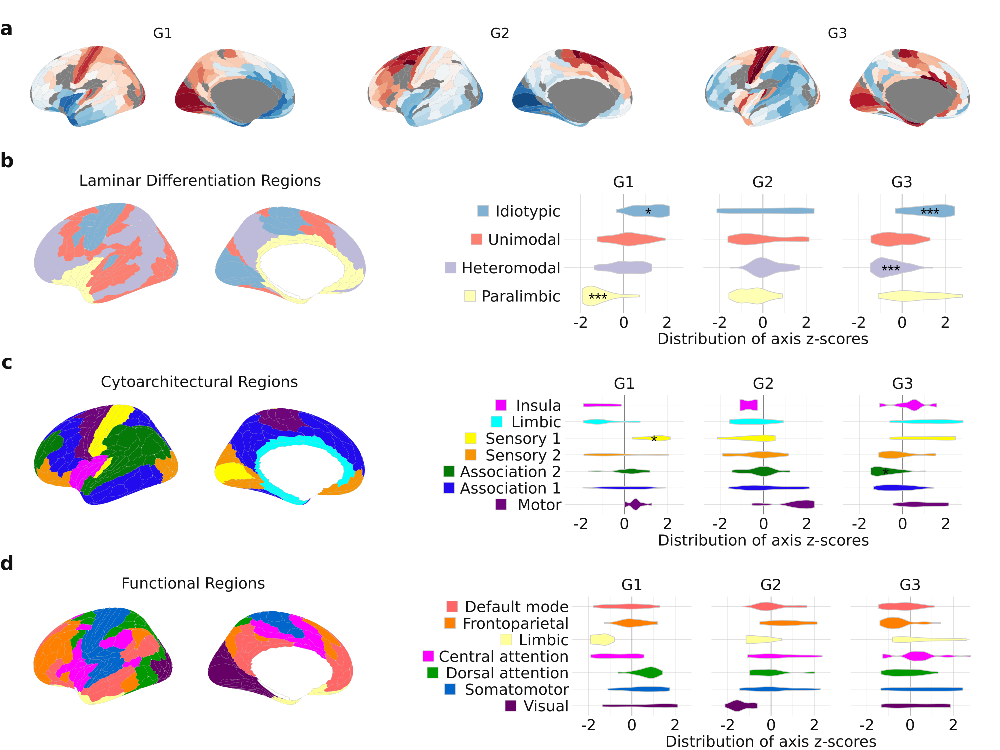

In [2250]:
%%R -w 20 -h 15 --units in -r 200 -i atlas_stats -i atlas_data
source("../code/plot_maps.R")
source("../code/Rplots.R")

g1 <- plot_hcp_wide(hcp_scores) + guides(fill='none') + theme(legend.margin=margin(t = -40, unit='pt'),
                                                              plot.tag.position = c(0, .95))
g2 = plot_hcp_classes(atlas_data, classes=Mesulam, classcolors=Mesulam_colors, classnames=Mesulam_names, ncol=4) +
    ggtitle('Laminar Differentiation Regions')
g2a = plot_atlas_violins(atlas_data, atlas_stats %>% filter(atlas=='Mesulam')) + plot_layout(tag_level='new') +
    theme(strip.text=element_text(size=22, color='grey7', family='Calibri'))

g3 = plot_hcp_classes(atlas_data, classes=vonEconomo, classcolors=vonEconomo_colors, classnames=vonEconomo_names, ncol=4) +
    ggtitle('Cytoarchitectural Regions')
g3a = plot_atlas_violins(atlas_data, atlas_stats %>% filter(atlas=='vonEconomo'), 
        classes=vonEconomo, classcolors=vonEconomo_colors, classlabels=vonEconomo_names,
        legend_positions=c(-5.1,-7.5,-7.5,-6.5,-6.5,-5.3,-5.1)-.6) + plot_layout(tag_level='new')

g4 = plot_hcp_classes(atlas_data, classes=Yeo, classcolors=Yeo_colors, classnames=Yeo_names, ncol=4) +
    ggtitle('Functional Regions')
g4a = plot_atlas_violins(atlas_data, atlas_stats %>% filter(atlas=='Yeo'), 
        classes=Yeo, classcolors=Yeo_colors, classlabels=Yeo_names,
        legend_positions=c(-5.1,-7.9,-8.7,-8.9,-5.3,-7.9,-7.8)-.5) + plot_layout(tag_level='new')

plot <- g1 / 
        ((g2 | plot_spacer() | g2a) + plot_layout(widths=c(10,1,12))) /
        ((g3 | plot_spacer() | g3a) + plot_layout(widths=c(10,1,12))) /
        ((g4 | plot_spacer() | g4a) + plot_layout(widths=c(10,1,12)))

(plot & theme(
    legend.position='none', 
    plot.title=element_text(hjust=0.5, size=22, color='grey7', family='Calibri',margin=margin(b=-30)),
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    # legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=0, l=0, "pt"),

    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0, vjust=1)
)) + plot_annotation(tag_level='a')

### Brainchart Maps

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


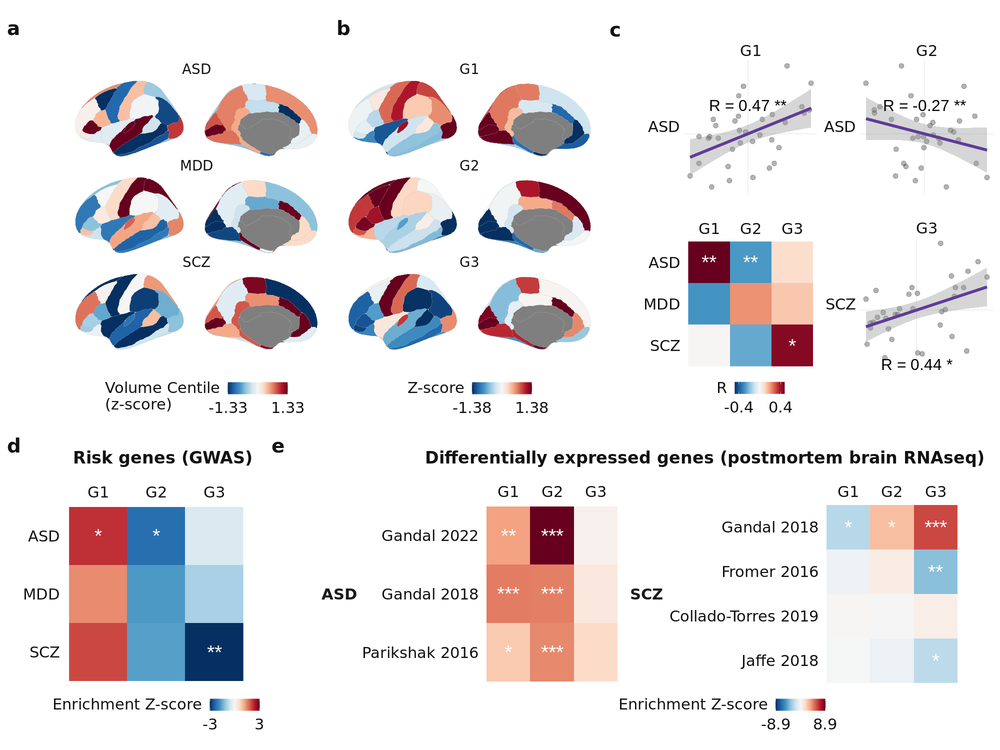

In [ ]:
%%R -w 20 -h 15 --units in -r 100
themed <- ((plot_brainchart / plot_gwas_degs) + plot_layout(heights=c(5,3))) & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    # strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=5, r=5, b=10, l=5, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

themed + plot_annotation(tag_level='a')

In [ ]:
deg_genes_scz = get_deg_combined(scz_only=True)
deg_genes_scz

,label,gene
0,Gandal 2018,TSPAN6
4,Gandal 2018,C1orf112
11,Gandal 2018,NIPAL3
14,Gandal 2018,SEMA3F
17,Gandal 2018,CYP51A1
...,...,...
453,Jaffe 2018,ATG4D
454,Jaffe 2018,RLIM
456,Jaffe 2018,KCNC3
457,Jaffe 2018,TMEM38A


In [ ]:
deg_genes_scz['gene'].drop_duplicates().shape

(5235,)

In [ ]:
scz_deg_up = deg_genes_scz.loc[lambda x: x['log2FC'] > 0]
# scz_deg_up
scz_deg_up_stats = compute_null_p(*compute_enrichments(weights, null_weights, scz_deg_up))
scz_deg_up_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,Gandal 2018,G1,0.0000,-0.004565,-0.000631,0.000311,-12.653619,False,0.0000,0.000000,True,2450,1133
1,Gandal 2018,G2,0.0000,-0.000572,0.000917,0.000311,-4.793254,False,0.0000,0.000000,True,2450,1133
2,Gandal 2018,G3,0.9924,0.000476,-0.000253,0.000306,2.379691,True,0.0152,0.020267,True,2450,1133
3,Fromer 2016,G1,0.0000,-0.003885,-0.000655,0.000834,-3.873279,False,0.0000,0.000000,True,329,173
4,Fromer 2016,G2,0.0006,-0.001809,0.000929,0.000845,-3.237945,False,0.0012,0.002057,True,329,173
5,Fromer 2016,G3,0.0544,-0.001624,-0.000247,0.000854,-1.612672,False,0.1088,0.118691,False,329,173
6,Collado-Torres 2019,G1,0.0000,-0.010909,-0.000659,0.001320,-7.762423,False,0.0000,0.000000,True,96,70
7,Collado-Torres 2019,G2,0.0000,-0.004536,0.000921,0.001329,-4.104201,False,0.0000,0.000000,True,96,70
8,Collado-Torres 2019,G3,0.0154,-0.003041,-0.000213,0.001329,-2.128439,False,0.0308,0.036960,True,96,70
9,Jaffe 2018,G1,0.0000,-0.008563,-0.000640,0.001885,-4.203265,False,0.0000,0.000000,True,101,36


In [ ]:
# scz_deg_gwas = deg_genes_scz.assign(label = lambda x: np.isin(x['gene'], gwas_genes.query("label=='SCZ'")['gene'])).drop_duplicates()
scz_deg_gwas = deg_genes_scz.loc[lambda x: np.isin(x['gene'], gwas_genes.query("label=='SCZ'")['gene'])]
scz_deg_gwas_stats = compute_null_p(*compute_enrichments(weights, null_weights, scz_deg_gwas))
scz_deg_gwas_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,Gandal 2018,G1,0.8118,0.000718,-0.000600,0.001492,0.883144,True,0.3764,0.7528,False,102,55
1,Gandal 2018,G2,0.6508,0.001484,0.000897,0.001497,0.392633,True,0.6984,0.9744,False,102,55
2,Gandal 2018,G3,0.1390,-0.001893,-0.000262,0.001497,-1.089277,False,0.2780,0.6672,False,102,55
3,Fromer 2016,G1,0.8720,0.005914,-0.000655,0.005635,1.165927,True,0.2560,0.6672,False,14,4
4,Fromer 2016,G2,0.5128,0.001167,0.000911,0.005628,0.045589,True,0.9744,0.9744,False,14,4
5,Fromer 2016,G3,0.1212,-0.006922,-0.000312,0.005677,-1.164491,False,0.2424,0.6672,False,14,4
6,Collado-Torres 2019,G1,0.9814,0.014139,-0.000513,0.007922,1.849410,True,0.0372,0.2976,False,2,2
7,Collado-Torres 2019,G2,0.5794,0.002791,0.001136,0.007922,0.209005,True,0.8412,0.9744,False,2,2
8,Collado-Torres 2019,G3,0.4672,-0.000801,-0.000164,0.007834,-0.081302,False,0.9344,0.9744,False,2,2
9,Jaffe 2018,G1,0.6400,0.006912,-0.000666,0.011202,0.676517,True,0.7200,0.9744,False,2,1


In [ ]:
scz_deg_n_studies = (deg_genes_scz
                     .join(deg_genes_scz.groupby('gene')['gene'].count().rename('n_degs'), on='gene')
                     .assign(n_degs = lambda x: np.where(x['n_degs']>1,'2+','1'))
                     .assign(label = lambda x: x['n_degs']).drop_duplicates()
                    #  .assign(in_gwas = lambda x: np.isin(x['gene'], gwas_genes.query("label=='SCZ'")['gene']))
                    #  .groupby(['in_gwas','n_degs']).count()
)
# scz_deg_n_studies
scz_deg_n_studies_stats = compute_null_p(*compute_enrichments(weights, null_weights, scz_deg_n_studies))
scz_deg_n_studies_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,1,G1,0.0028,-0.001203,-0.000627,0.000214,-2.699724,False,0.0056,0.0112,True,4729,2026
1,1,G2,0.9980,0.001568,0.000924,0.000218,2.956944,True,0.0040,0.0112,True,4729,2026
2,1,G3,1.0000,0.001137,-0.000255,0.000214,6.500130,True,0.0000,0.0000,True,4729,2026
3,2+,G1,0.4190,-0.000777,-0.000647,0.000591,-0.220838,False,0.8380,0.8940,False,506,336
4,2+,G2,0.5530,0.000995,0.000918,0.000601,0.128277,True,0.8940,0.8940,False,506,336
5,2+,G3,0.0060,-0.001771,-0.000251,0.000591,-2.570694,False,0.0120,0.0180,True,506,336


In [ ]:
two_studies_genes = (scz_deg_n_studies.query("n_degs=='2+'")
                     .assign(label = 'Two or more studies').drop('n_degs', axis=1)
)
one_study_genes = (deg_genes_scz
 .loc[lambda x: np.isin(x['gene'], scz_deg_n_studies.query("n_degs=='1'")['gene'])]
 .assign(label = lambda x: ['Only ' + study for study in x['label']])
 .assign(label = lambda x: x['label'].str.replace("Collado-\nTorres", "Collado-Torres"))
)

n_studies_labels = pd.concat([one_study_genes, two_studies_genes])

overlap_levels = n_studies_labels['label'].unique()
two_studies_plot = make_deciles_plot(weights, labels=n_studies_labels, levels=overlap_levels, na_value=np.nan).dropna()
two_studies_plot 

,gene,G,G_score,G_decile,label,rank_in_decile
13439,PTBP3,G2,-0.014148,0,Two or more studies,1
1613,CYP46A1,G1,-0.014704,0,Two or more studies,1
21499,RAB11FIP1,G3,-0.015007,0,Two or more studies,1
10970,HOOK1,G2,-0.014344,0,Two or more studies,2
45,ABLIM2,G1,-0.014763,0,Two or more studies,2
...,...,...,...,...,...,...
16548,B3GNT5,G3,0.014802,9,Only Gandal 2018,276
23104,TNFRSF10B,G3,0.014802,9,Only Gandal 2018,277
18127,FABP6,G3,0.014790,9,Only Gandal 2018,278
22318,SLC7A7,G3,0.014742,9,Only Gandal 2018,279


In [ ]:
deg_genes_scz_gwas = pd.concat([deg_genes_scz, gwas_genes.query("label=='SCZ'").assign(label='GWAS')])

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


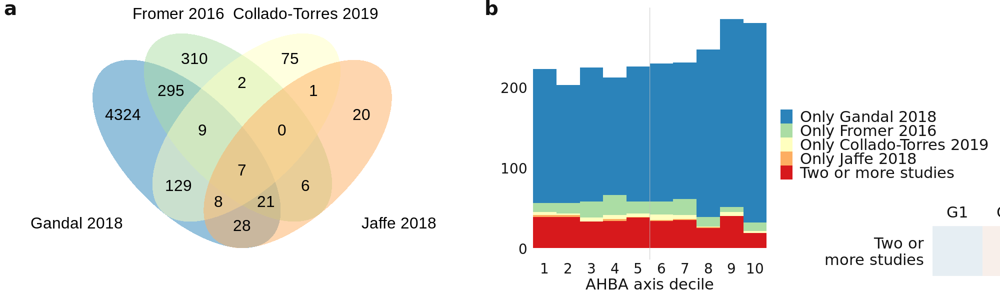

In [ ]:
%%R -i deg_genes_scz -i two_studies_plot -i scz_deg_n_studies_stats -w 20 -h 6 -u in -r 100
source("../code/brainspanPlots.R")
source("../code/enrichmentsPlots.R")
library(ggvenn)

g0 <- scz_deg_genes_list <- deg_genes_scz %>% split(.$label) %>% lapply(function(x) x$gene) %>% 
    ggvenn(text_size=8, set_name_size=8, show_percentage=F,
        fill_color=brewer.spectral(5)[-c(1)] %>% rev,
        stroke_color='black', stroke_size=0) + 
    coord_equal(clip='off')

g1 <- two_studies_plot %>% filter(G=='G3') %>% 
    plot_deciles_histogram(facet='') + 
    scale_fill_manual(values=brewer.spectral(5), name='')

g1b <- scz_deg_n_studies_stats %>% filter(label=='2+') %>% 
    mutate(label = 'Two or\nmore studies') %>% 
    plot_heatmap_simple(size=10) + 
    theme(
        # axis.text.y=element_blank(),
        legend.position='none'
    ) + 
    plot_layout(tag_level='new')

plot <- g0 | g1 + inset_element(g1b, t=.3, b=-.1, l=1, r=2.5, align_to='panel')

themed <- (plot + plot_layout(widths=c(2,1))) & theme(
    text=element_text(size=22, color='grey7', family='Calibri'),
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    # plot.margin = margin(t=50, r=10, b=5, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

plot_venn <- themed + plot_annotation(tag_level='a')
plot_venn

In [ ]:
# scz_deg_n_studies = deg_genes_scz.groupby('gene').count().apply(lambda x: np.where(x>1,'2+','1')).reset_index()
scz_deg_2_studies = deg_genes_scz.loc[lambda x: np.isin(x['gene'], scz_deg_n_studies.query("label=='1'")['gene'])]
# scz_deg_2_studies
scz_deg_2_studies_stats = compute_null_p(*compute_enrichments(weights, null_weights, scz_deg_2_studies))
scz_deg_2_studies_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,Gandal 2018,G1,0.0030,-0.001239,-0.000628,0.000230,-2.658671,False,0.0060,0.024000,True,4324,1827
1,Gandal 2018,G2,0.9976,0.001575,0.000922,0.000235,2.780422,True,0.0048,0.024000,True,4324,1827
2,Gandal 2018,G3,1.0000,0.001442,-0.000256,0.000228,7.460553,True,0.0000,0.000000,True,4324,1827
3,Fromer 2016,G1,0.3592,-0.000958,-0.000619,0.000897,-0.378388,False,0.7184,0.783709,False,309,149
4,Fromer 2016,G2,0.8836,0.002041,0.000932,0.000911,1.216871,True,0.2328,0.399086,False,309,149
5,Fromer 2016,G3,0.1150,-0.001359,-0.000268,0.000906,-1.204451,False,0.2300,0.399086,False,309,149
6,Collado-Torres 2019,G1,0.6914,0.000281,-0.000604,0.001727,0.512295,True,0.6172,0.740640,False,75,40
7,Collado-Torres 2019,G2,0.5094,0.001021,0.000975,0.001780,0.026214,True,0.9812,0.981200,False,75,40
8,Collado-Torres 2019,G3,0.2358,-0.001471,-0.000198,0.001766,-0.720807,False,0.4716,0.628800,False,75,40
9,Jaffe 2018,G1,0.1920,-0.005814,-0.000573,0.005611,-0.934161,False,0.3840,0.576000,False,11,4


In [ ]:
not_WM_genes = get_layer_genes().query("label in ['WM']")['gene']
scz_deg_not_WM = deg_genes_scz.loc[lambda x: ~np.isin(x['gene'], not_WM_genes)]
scz_deg_not_WM_stats = compute_null_p(*compute_enrichments(weights, null_weights, scz_deg_not_WM))
scz_deg_not_WM_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,Gandal 2018,G1,0.1142,-0.000934,-0.000634,0.000245,-1.222902,False,0.2284,0.548160,False,3764,1611
1,Gandal 2018,G2,0.6768,0.001037,0.000921,0.000251,0.459981,True,0.6464,0.923733,False,3764,1611
2,Gandal 2018,G3,0.0000,-0.001888,-0.000253,0.000249,-6.552929,False,0.0000,0.000000,True,3764,1611
3,Fromer 2016,G1,0.4932,-0.000648,-0.000632,0.000640,-0.025163,False,0.9864,0.986400,False,527,293
4,Fromer 2016,G2,0.7752,0.001419,0.000932,0.000632,0.769793,True,0.4496,0.770743,False,527,293
5,Fromer 2016,G3,0.0000,-0.003983,-0.000260,0.000643,-5.785323,False,0.0000,0.000000,True,527,293
6,Collado-Torres 2019,G1,0.3464,-0.001048,-0.000649,0.001004,-0.398238,False,0.6928,0.923733,False,178,124
7,Collado-Torres 2019,G2,0.1658,-0.000014,0.000926,0.000988,-0.952062,False,0.3316,0.663200,False,178,124
8,Collado-Torres 2019,G3,0.0148,-0.002444,-0.000240,0.001001,-2.201503,False,0.0296,0.088800,False,178,124
9,Jaffe 2018,G1,0.5556,-0.000410,-0.000626,0.001545,0.139509,True,0.8888,0.969600,False,78,52


### Layers plot with DEGs from each study

In [ ]:
layer_levels = ['WM','L6','L5','L4','L3','L2','L1','No layer\nannotation'][::-1]
layers_plot = make_deciles_plot(weights, labels=get_layer_genes(), levels=layer_levels, na_value='No layer\nannotation')
layers_plot_with_degs = make_deciles_plot_with_degs(layers_plot, deg_genes_scz)

### Development trajectories for DEGs from each study

Fit GAM models to all SCZ DEGs matched in BrainSpan

In [ ]:
hcp_bs_mapping = get_hcp_bs_mapping_v2()
bs_exp, bs_col, bs_row = get_brainspan()
bs_clean = clean_brainspan(bs_exp, bs_col, bs_row, hcp_bs_mapping)
bs_continuous = make_continuous(bs_clean, norm_samples=True)

In [ ]:
genes_to_fit = np.intersect1d(bs_clean.columns, deg_genes_scz['gene'].dropna())
scz_deg_genes_models = fit_gam_models(bs_continuous, genes_to_fit, alpha=.5)
scz_deg_genes_curves, scz_deg_genes_points = predict_gam_curves(scz_deg_genes_models, bs_continuous, genes_to_fit)

In [ ]:
quantiles_degs = make_quantiles_plot(weights, q=5, labels=deg_genes_scz, levels=None).dropna()
quantiles_degs

,gene,G,G_score,G_quantile,label,rank_in_quantile
10332,FCHO2,G2,-0.009647,0,Jaffe 2018,1
21003,PGP,G3,-0.010860,0,Jaffe 2018,1
2850,GXYLT2,G1,-0.012665,0,Jaffe 2018,1
14956,TIMP2,G2,-0.009899,0,Jaffe 2018,2
16165,AKIRIN2,G3,-0.010981,0,Jaffe 2018,2
...,...,...,...,...,...,...
20663,NTSR2,G3,0.009320,4,Gandal 2018,628
17286,CLEC3B,G3,0.009290,4,Gandal 2018,629
18556,GGT5,G3,0.009274,4,Gandal 2018,630
22714,SYK,G3,0.009252,4,Gandal 2018,631


In [ ]:
quantiles_age_curves_plot = (quantiles_degs
 .query("G=='G3'")
 .join(scz_deg_genes_curves.set_index('gene'), on='gene')
 .groupby(['label','G_quantile','age_log10'])
 .agg({'pred':'mean', 'gene':'count'}).rename({'gene':'n_genes'}, axis=1)
 .reset_index()
)
cquantiles_age_curves_plot

,label,G_quantile,age_log10,pred,n_genes
0,Gandal 2018,0,1.748188,0.836465,656
1,Gandal 2018,0,1.772677,0.846434,656
2,Gandal 2018,0,1.797166,0.856399,656
3,Gandal 2018,0,1.821655,0.866360,656
4,Gandal 2018,0,1.846144,0.876313,656
...,...,...,...,...,...
1995,Jaffe 2018,4,4.074647,1.365844,10
1996,Jaffe 2018,4,4.099136,1.367310,10
1997,Jaffe 2018,4,4.123625,1.368806,10
1998,Jaffe 2018,4,4.148114,1.370322,10


### New fig

`geom_smooth()` using formula = 'y ~ x'


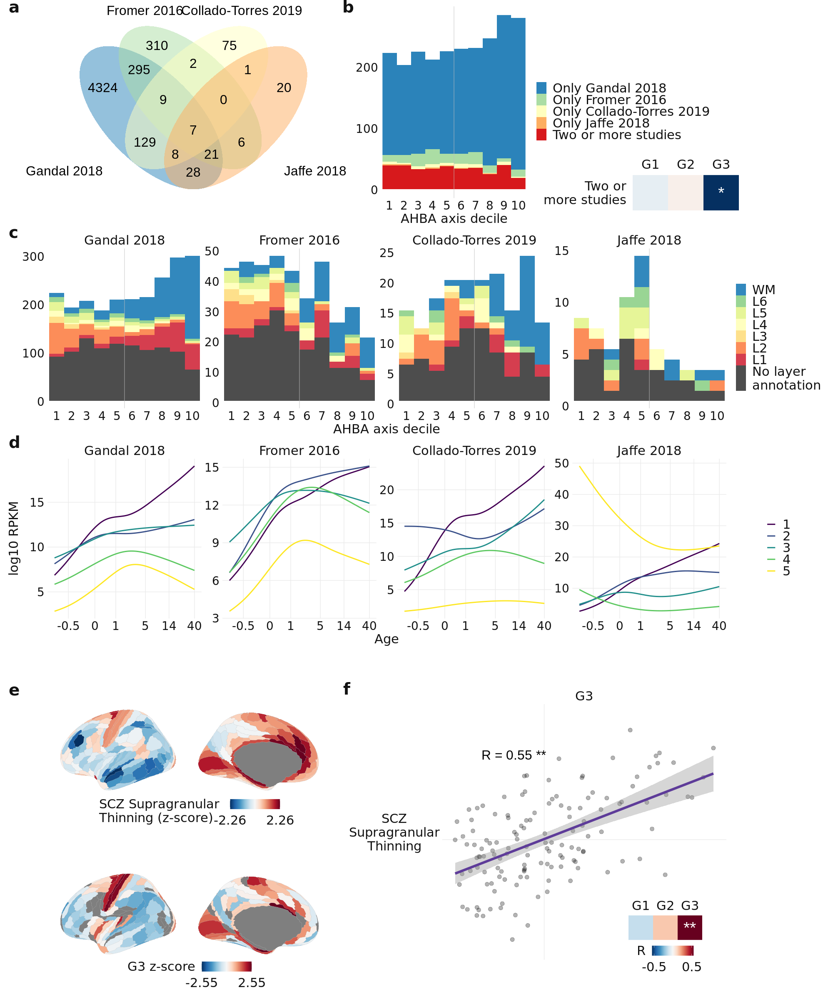

In [ ]:
%%R -i layers_plot_with_degs -i quantiles_age_curves_plot -w 20 -h 24 -u in -r 100
source("../code/brainspanPlots.R")
source("../code/enrichmentsPlots.R")

g1 <- layers_plot_with_degs %>% filter(G=='G3') %>% 
    plot_deciles_histogram + theme(plot.tag.position = c(0, 1))

g2 <- quantiles_age_curves_plot %>% filter(n_genes > 5) %>% 
    plot_quantiles_age_curves + theme(plot.tag.position = c(0, 1))

layout <- c(
    area(t=1,b=12,l=1,r=47),
    area(t=13,b=22,l=1,r=48),
    area(t=23,b=32,l=1, r=48),
    area(t=33,b=48,l=1, r=48)
)

plot <- (plot_venn / g1 / g2 / plot_scz_supra) + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'),
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    # plot.margin = margin(t=0, r=10, b=0, l=10, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

themed + plot_annotation(tag_level='a')

---

# Other

In [852]:
get_expression_abagen(fetch_hcp(), donors_threshold=3, save_name = 'hcp_3d')

INFO: Donor-specific atlases provided; using native coords for tissue samples
INFO: Reannotating probes with information from Arnatkevic̆iūtė et al., 2019, NeuroImage
INFO: Filtering probes with intensity-based threshold of 0.5
INFO: 32669 probes survive intensity-based filtering
INFO: Reducing probes indexing same gene with method: diff_stability
INFO: 15946 genes remain after probe filtering + selection
INFO: 458 / 477 samples matched to regions for donor #9861
INFO: 346 / 367 samples matched to regions for donor #10021
INFO: 173 / 181 samples matched to regions for donor #12876
INFO: 259 / 263 samples matched to regions for donor #14380
INFO: 222 / 224 samples matched to regions for donor #15496
INFO: 231 / 240 samples matched to regions for donor #15697
INFO: Aggregating samples to regions with provided region_agg: donors


137 / 180 regions remain after filtering for regions with samples from >= 3 donors
15946 / 15946 genes remain after filtering for top 1.0 stability
Expression matrix saved to ../data/abagen-data/expression/hcp_3d.csv


gene_symbol,A1BG,A1BG-AS1,A2M,A2ML1,A3GALT2,A4GALT,AAAS,AACS,AADACL3,AADAT,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
label,,,,,,,,,,,,,,,,,,,,,
1,0.234124,0.260771,0.588592,0.585517,0.535049,0.499659,0.686152,0.373783,0.570563,0.399161,...,0.472747,0.402138,0.387873,0.584783,0.526904,0.524652,0.329940,0.839740,0.825577,0.346719
4,0.363618,0.284738,0.496556,0.429600,0.476854,0.397701,0.681523,0.398147,0.519214,0.494383,...,0.529052,0.523408,0.432438,0.556826,0.398928,0.537116,0.374318,0.810666,0.738654,0.357823
5,0.219162,0.217884,0.454745,0.625059,0.531481,0.637702,0.648171,0.333810,0.493484,0.460878,...,0.537539,0.425450,0.331184,0.589692,0.505485,0.520010,0.368348,0.784044,0.761205,0.309604
6,0.418642,0.400929,0.561077,0.509917,0.470311,0.389403,0.633253,0.549098,0.508425,0.534764,...,0.543622,0.491083,0.476248,0.491979,0.575953,0.441680,0.354495,0.684917,0.768377,0.443219
8,0.312791,0.376259,0.671071,0.548835,0.549000,0.534500,0.619065,0.558217,0.494272,0.574537,...,0.621652,0.367085,0.405083,0.373914,0.526729,0.423670,0.446146,0.716991,0.631567,0.326405
9,0.330776,0.315457,0.689649,0.600908,0.527557,0.458393,0.683072,0.435954,0.555677,0.541644,...,0.544148,0.314545,0.408417,0.465563,0.585216,0.425428,0.401895,0.815618,0.698758,0.298283
10,0.487532,0.455947,0.385058,0.567572,0.201281,0.651707,0.623402,0.607785,0.484330,0.431802,...,0.456112,0.478166,0.347383,0.384267,0.390010,0.302454,0.509522,0.635343,0.433496,0.419329
12,0.396896,0.359173,0.602307,0.699906,0.518698,0.568528,0.433057,0.581321,0.487739,0.371495,...,0.601115,0.402015,0.425051,0.330539,0.558085,0.367348,0.560483,0.571414,0.432263,0.291387
13,0.109955,0.280747,0.522662,0.587962,0.545114,0.458559,0.622111,0.570489,0.533427,0.558439,...,0.505253,0.581378,0.388707,0.454529,0.495120,0.412031,0.509706,0.871423,0.820190,0.220062


In [869]:
expression_nofilter = gradientVersion().fit('hcp_3d').expression
nofilter_genes = set(expression_nofilter.columns).difference(set(dme_3d_ds5.weights.index))
expression_complement_genes = expression_nofilter.loc[:, list(nofilter_genes)]
dme_3d_complement = gradientVersion(marker_genes=[]).fit(expression_complement_genes)

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=hcp_3d
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=(data given)


In [881]:
dme_3d_complement.corr_scores(dme_3d_ds5)

,0,1,2,3,4
0,0.395219,-0.163697,-0.065809,0.537252,0.248988
1,0.415446,-0.530144,-0.308825,-0.209206,-0.076004
2,-0.467386,-0.119901,-0.521893,0.247322,-0.591358
3,0.625904,0.235870,-0.048244,-0.181043,-0.542918
4,0.071041,-0.315173,0.170696,0.577003,-0.044396


In [884]:
signs = np.diag(np.sign(dme_3d_complement.corr_scores(dme_3d_ds5)))[:3]
weights_complement = dme_3d_complement.weights * signs
null_weights_complement = shuffle_gene_weights(weights_complement, n=5000)

In [911]:
layer_genes = get_layer_genes(which='maynard', add_hse_genes=True)
layer_stats_complement = compute_null_p(*compute_enrichments(weights_complement, null_weights_complement, layer_genes))

In [914]:
HSE_row = pd.DataFrame({
    'label':'HSE', 'C':['C1','C2','C3'],
    'z':0, 'p':1
    })
layer_stats_complement_join = pd.concat([HSE_row, layer_stats_complement])

/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: UserWarning: DataFrame contains duplicated elements in the index, which will lead to loss of the row names in the resulting data.frame
  warnings.warn('DataFrame contains duplicated elements in the index, '
/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "pos". Fall back to string conversion. The error is: Series can only be of one type, or None (and here we have <class 'float'> and <class 'bool'>). If happening with a pandas DataFrame the method infer_objects() will normalize data types before conversion.
  warnings.warn('Error while trying to convert '
/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "sig". Fall back to string conversion. The error is: Series can only be of one type, or None (and here we have <class 'float'> and <class 'bool'>). If happening with 

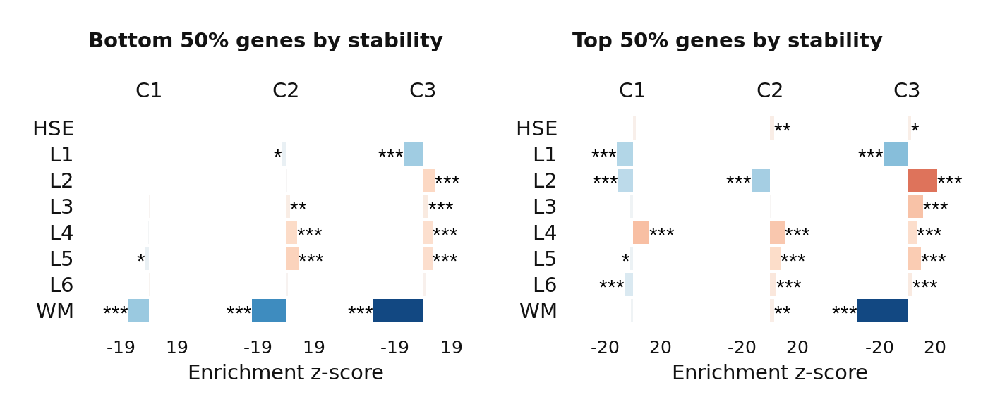

In [915]:
%%R -i layer_stats -i layer_stats_complement_join -w 120 -h 50 --units mm -r 300
source("../code/fig1_plots.R")

plot_enrichment_bars_z(layer_stats_complement_join) + ggtitle("Bottom 50% genes by stability") |
plot_enrichment_bars_z(layer_stats) + ggtitle("Top 50% genes by stability")

In [701]:
test_expression = dme_3d_ds5.expression
test_expression_norm = test_expression.apply(lambda x: (x-np.mean(x))/np.std(x))

For DME, weights are perfectly correlated to correlations, but require a scaling factor (which is not the sqrt of eigenvalues)

In [716]:
dme_nonorm = gradientVersion(approach='dm').fit(test_expression)
dme_norm = gradientVersion(approach='dm').fit(test_expression_norm)

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=(data given)
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=(data given)


In [719]:
correlate(dme_norm.expression.iloc[:,:5], dme_norm.scores)

,0,1,2,3,4
A1BG,-0.799928,-0.123480,0.060814,0.337524,-0.032036
A1BG-AS1,-0.619449,-0.158851,-0.252917,0.179603,0.238821
AAAS,0.570415,0.216292,0.043921,0.511854,0.191685
AAED1,-0.707501,0.019458,0.247449,0.127495,-0.014479
AAGAB,-0.292929,0.448671,-0.460429,0.080675,-0.080290


In [761]:
correlate(dme_nonorm.weights.iloc[:5,:], correlate(dme_nonorm.expression.iloc[:,:5], dme_nonorm.scores))

,0,1,2,3,4
G1,1.000000,0.414115,0.085600,-0.629081,-0.236993
G2,0.414115,1.000000,-0.459651,0.086902,0.758802
G3,0.085600,-0.459651,1.000000,-0.156131,-0.504952
G4,0.629081,-0.086902,0.156131,-1.000000,-0.354569
G5,0.236993,-0.758802,0.504952,-0.354569,-1.000000


In [724]:
dme_norm.weights.iloc[:5,:] * np.sqrt(dme_norm.eigenvalues)

,G1,G2,G3,G4,G5
A1BG,-0.007400,-0.001265,0.000581,0.003421,-0.000345
A1BG-AS1,-0.005730,-0.001628,-0.002416,0.001820,0.002568
AAAS,0.005277,0.002216,0.000420,0.005187,0.002061
AAED1,-0.006545,0.000199,0.002364,0.001292,-0.000156
AAGAB,-0.002710,0.004597,-0.004398,0.000818,-0.000863


In [741]:
np.sqrt(dme_norm.eigenvalues)

array([0.47016197, 0.28566623, 0.23133507, 0.22049122, 0.1866316 ])

In [738]:
dme_norm.weights.iloc[:5,:] / correlate(dme_norm.expression.iloc[:,:5], dme_norm.clean_scores())

,G1,G2,G3,G4,G5
A1BG,0.019675,0.035869,0.041295,NaN,NaN
A1BG-AS1,0.019675,0.035869,0.041295,NaN,NaN
AAAS,0.019675,0.035869,0.041295,NaN,NaN
AAED1,0.019675,0.035869,0.041295,NaN,NaN
AAGAB,0.019675,0.035869,0.041295,NaN,NaN


For PCA on *normalized* expression data, multiplying weights by sqrt of eigenvalues gives correlation

In [728]:
pca_nonorm = gradientVersion(approach='pca').fit(test_expression)
pca_norm = gradientVersion(approach='pca').fit(test_expression_norm)

New gradients version: method=pca, kernel=None, sparsity=0, data=(data given)
New gradients version: method=pca, kernel=None, sparsity=0, data=(data given)


In [729]:
correlate(pca_norm.expression.iloc[:,:5], pca_norm.scores)

,0,1,2,3,4
A1BG,-0.791066,-0.144869,0.053260,-0.376208,0.132166
A1BG-AS1,-0.621560,-0.103477,-0.312323,-0.266535,-0.204103
AAAS,0.608615,0.218765,0.042873,-0.509891,-0.142269
AAED1,-0.721398,0.007776,0.233313,-0.162772,0.037971
AAGAB,-0.270646,0.446661,-0.512720,-0.140886,0.157709


In [730]:
pca_norm.weights.iloc[:5,:] * np.sqrt(pca_norm.eigenvalues)

,G1,G2,G3,G4,G5
A1BG,-0.793969,-0.145401,0.053455,0.377588,-0.132651
A1BG-AS1,-0.623841,-0.103856,-0.313469,0.267513,0.204852
AAAS,0.610848,0.219568,0.043031,0.511762,0.142790
AAED1,-0.724045,0.007804,0.234170,0.163369,-0.038110
AAGAB,-0.271639,0.448300,-0.514602,0.141403,-0.158289


But not when expression is not normalized

In [ ]:
correlate(pca_nonorm.expression.iloc[:,:5], pca_nonorm.scores)

,0,1,2,3,4
A1BG,-0.799182,-0.139142,0.017693,-0.359541,-0.032120
A1BG-AS1,-0.625205,-0.087583,-0.346178,-0.209760,0.207081
AAAS,0.606939,0.193150,0.001403,-0.513396,0.147090
AAED1,-0.725819,0.016109,0.215993,-0.162015,-0.005784
AAGAB,-0.266119,0.493802,-0.496883,-0.102398,-0.185092


In [731]:
pca_nonorm.weights.iloc[:5,:] * np.sqrt(pca_nonorm.eigenvalues)

,G1,G2,G3,G4,G5
A1BG,-0.109975,-0.012351,0.001809,0.038000,-0.008992
A1BG-AS1,-0.086318,-0.007036,-0.044074,0.020713,-0.034349
AAAS,0.084441,0.022246,0.002997,0.069723,-0.012394
AAED1,-0.100130,0.006823,0.027504,0.015212,-0.014925
AAGAB,-0.037169,0.064738,-0.063095,0.009598,0.014046


PCA weights and DME weights are correlated

In [742]:
correlate(pca_nonorm.weights, dme_nonorm.weights)

,G1,G2,G3,G4,G5
G1,0.999692,-0.054081,0.018527,0.140330,-0.064532
G2,-0.106528,0.985321,0.241891,-0.002708,0.065388
G3,0.013745,-0.085745,0.946921,-0.150567,0.540945
G4,0.227045,-0.103891,0.190735,0.930999,0.322800
G5,0.420148,-0.191924,-0.043857,0.185402,-0.730618


In [743]:
correlate(pca_norm.weights, dme_norm.weights)

,G1,G2,G3,G4,G5
G1,0.998799,0.036218,-0.059470,0.212147,-0.083605
G2,0.008929,0.991015,0.015861,-0.160805,0.264211
G3,0.004758,0.018453,0.991101,0.084487,0.018487
G4,-0.006342,0.000495,0.017818,0.966141,0.100315
G5,0.026248,-0.120785,0.034916,-0.114759,0.908551
